# Import packages, open data

In [14]:
import seaborn as sns
from datetime import datetime
#from skimage.io import imsave
import openpyxl
import numpy as np
import matplotlib.pyplot as plt
#%plt.style.use("v_paper")
import pandas as pd
from scipy.io import loadmat
from scipy.io import savemat
%matplotlib inline
import seaborn as sns
import statsmodels.formula.api as smf
import re
from statsmodels.stats.anova import anova_lm
import os
import os.path
#import statsmodels.api as smapi
import sys
import warnings
from sklearn.linear_model import LinearRegression
if not sys.warnoptions:
    warnings.simplefilter("ignore")
import seaborn as sns
import statsmodels as sm
import scipy
from pathlib import Path
from itertools import chain
from scipy import optimize

In [15]:
GoodICFiles=pd.read_pickle("Z:\GrunwaldKadow_group\Sophie\WalkProject\GoodICsdf.pkl")

In [16]:
GoodICFiles.columns.unique()

Index([              'index',                     0,               'FlyID',
              'Templatefile',              'TSfile',               'expID',
                       'UAS',                'GAL4',      'Correspondance',
                'RegionFile',       'WalkRegressor',      'GroomRegressor',
            'FlailRegressor',       'TurnRegressor', 'ForcedWalkRegressor',
       'ForcedTurnRegressor',                  'FR',      'TSlowlimForced',
           'TShighlimForced',       'TSlowlimFlail',      'TShighlimFlail',
              'TSlowlimWalk',       'TShighlimWalk',         'eye_painted',
             'WalkSubstrate',        '12RegionFile'],
      dtype='object')

In [17]:
GoodICFiles["GAL4"].unique()

array(['Nsyb', 'GMR57C10', nan, 'Cha', 'Vglut', 'Gad', 'TH', 'Trh', 'TDC'],
      dtype=object)

# Correlation binary components

In [6]:
Compdf=pd.read_pickle("Z:\GrunwaldKadow_group\Sophie\WalkProject\Compdf.pkl")
GoodICFiles=pd.read_pickle("Z:\GrunwaldKadow_group\Sophie\WalkProject\GoodICsdf.pkl")
Regionsdf=pd.read_pickle("Z:\GrunwaldKadow_group\Sophie\WalkProject\Regionsdf.pkl")

GoodICFiles.loc[GoodICFiles.index==0,'TSlowlimWalk']=0
GoodICFiles.loc[GoodICFiles.index==0,'TShighlimWalk']=4999
GoodICFiles.loc[GoodICFiles.index==24,'TSlowlimWalk']=2
GoodICFiles.loc[GoodICFiles.index==24,'TShighlimWalk']=4998
GoodICFiles.loc[GoodICFiles.index==126,'TSlowlimWalk']=1
GoodICFiles.loc[GoodICFiles.index==130,'TSlowlimWalk']=1
GoodICFiles.loc[GoodICFiles.index==130,'TShighlimWalk']=3000

In [7]:
Regionsdf=Regionsdf.query('FR>20')
Compdf=Compdf.query('FR>20')
GoodICFiles=GoodICFiles.query('FR>20')

In [8]:
CompOrder=pd.read_csv('Z:\GrunwaldKadow_group\Sophie\WalkProject\AllCompIDOrderedVF.txt',header=None)

In [9]:
len(CompOrder)

89

In [10]:
GoodICFiles.loc[GoodICFiles.index==0,'TSlowlimWalk']=0
GoodICFiles.loc[GoodICFiles.index==0,'TShighlimWalk']=4999
GoodICFiles.loc[GoodICFiles.index==126,'TSlowlimWalk']=1
GoodICFiles.loc[GoodICFiles.index==130,'TSlowlimWalk']=1
GoodICFiles.loc[GoodICFiles.index==130,'TShighlimWalk']=3000

In [10]:
#CompCorron200=np.load('ICCorron200_sup20Hz.npy')
#CompCorroff200=np.load('ICCorroff200_sup20Hz.npy')
#CompCorronoff200=np.load('ICCorronoff200_sup20Hz.npy')

In [11]:
CompCorronoff200=np.zeros((GoodICFiles.shape[0],len(CompOrder),201))
CompCorroff200=np.zeros((GoodICFiles.shape[0],len(CompOrder),201))
CompCorron200=np.zeros((GoodICFiles.shape[0],len(CompOrder),201))
CompCorron200Time=np.zeros((GoodICFiles.shape[0],len(CompOrder)))
Compdf['OnTime']=np.nan


In [12]:
for i in range(GoodICFiles.shape[0]):
#for i in range(7,10):
  #  try:
        if GoodICFiles.iloc[i]['WalkRegressor'] != '':
            TS=loadmat(GoodICFiles.iloc[i]['TSfile'].replace('/','\\').replace('\\media\\NAS','Z:\\GrunwaldKadow_group').replace('.mat','GoodIC.mat'))['TSgoodIC']

            try:
                Regressor =loadmat(GoodICFiles.iloc[i]['WalkRegressor'].replace('kd',''))['R']
            except:
                try:
                    Regressor =loadmat(GoodICFiles.iloc[i]['WalkRegressor'].replace('kd',''))['Rwalk']
                except:
                    try:
                        Regressor =loadmat(GoodICFiles.iloc[i]['WalkRegressor'].replace('WalkRbinkd','Rbin'))['R']
                    except:
                        try:
                            Regressor =loadmat(GoodICFiles.iloc[i]['WalkRegressor'].replace('Rbinkd','Rbin'))['Rbin']
                        except:
                            Regressor =loadmat(GoodICFiles.iloc[i]['WalkRegressor'].replace('kd',''))['Rbin']

            if Regressor.shape[0]<Regressor.shape[1]:
                Regressor=Regressor.T
            if TS.shape[0]>TS.shape[1]:
                TS=TS.T            
            if TS.shape[1]==(Regressor.shape[0]+2):
                TS=TS[:,1:Regressor.shape[0]+1]      
            if TS.shape[1]==(Regressor.shape[0]+1):
                TS=TS[:,1:Regressor.shape[0]]   
                
            if TS.shape[1]==(Regressor.shape[0]+3):
                TS=TS[:,2:Regressor.shape[0]-1]    
            if TS.shape[1]==(Regressor.shape[0]-1):
                Regressor=Regressor[1:Regressor.shape[0]]    

            if TS.shape[1]==(Regressor.shape[0]-2):
                Regressor=Regressor[1:Regressor.shape[0]-1]    
            if TS.shape[1]==(Regressor.shape[0]-3):
                Regressor=Regressor[2:Regressor.shape[0]-1] 
            if TS.shape[1]==(Regressor.shape[0]-4):
                Regressor=Regressor[2:Regressor.shape[0]-2]                 
            if TS.shape[1]==(Regressor.shape[0]-1):
                Regressor=Regressor[1:Regressor.shape[0]]    
            if TS.shape[1]==(Regressor.shape[0]-6):
                Regressor=Regressor[3:Regressor.shape[0]-3]     
            if TS.shape[1]==(Regressor.shape[0]-5):
                Regressor=Regressor[3:Regressor.shape[0]-2]                     
            if TS.shape[1]==(Regressor.shape[0]+2):
                TS=TS[:,1:Regressor.shape[0]+1]
            if TS.shape[1]==(Regressor.shape[0]+1):
                TS=TS[:,0:Regressor.shape[0]]                 
            if TS.shape[1]==(Regressor.shape[0]+6):
                TS=TS[:,3:TS.shape[1]-3]    
              
            if TS.shape[1]!=(Regressor.shape[0]): 
                TS=TS[:,int(GoodICFiles.iloc[i]['TSlowlimWalk']):int(GoodICFiles.iloc[i]['TShighlimWalk']+1)]
                
            if Regressor.shape[0]<Regressor.shape[1]:
                Regressor=Regressor.T

            if TS.shape[1]==(Regressor.shape[0]+2):
                TS=TS[:,1:Regressor.shape[0]+1]
            if TS.shape[1]==(Regressor.shape[0]+1):
                TS=TS[:,1:Regressor.shape[0]]            
            if TS.shape[1]==(Regressor.shape[0]+3):
                TS=TS[:,2:Regressor.shape[0]-1]    
            if TS.shape[1]==(Regressor.shape[0]-1):
                Regressor=Regressor[1:Regressor.shape[0]]    

            if TS.shape[1]==(Regressor.shape[0]-2):
                Regressor=Regressor[1:Regressor.shape[0]-1]    
            if TS.shape[1]==(Regressor.shape[0]-3):
                Regressor=Regressor[2:Regressor.shape[0]-1] 
            if TS.shape[1]==(Regressor.shape[0]-4):
                Regressor=Regressor[2:Regressor.shape[0]-2]                 
            if TS.shape[1]==(Regressor.shape[0]-1):
                Regressor=Regressor[1:Regressor.shape[0]]    
            if TS.shape[1]==(Regressor.shape[0]-6):
                Regressor=Regressor[3:Regressor.shape[0]-3]                        
            if TS.shape[1]==(Regressor.shape[0]+2):
                TS=TS[:,1:Regressor.shape[0]+1]
            if TS.shape[1]==(Regressor.shape[0]+1):
                TS=TS[:,0:Regressor.shape[0]]  


            FR=GoodICFiles.iloc[i]['FR']
            #if len(TS)!=1 and pd.isnull(FR)==False:
            if len(TS)!=1 and FR>4:
                print(GoodICFiles.iloc[i]['expID'])

                Ron=np.zeros(len(Regressor))
                Roff=np.zeros(len(Regressor))
                for m in range(int(1*FR),int(len(Regressor)-1*FR)):
                    if Regressor[m]==1 and all(Regressor[int(m-1*FR):int(m)]==0) and (np.mean(Regressor[int(m+1):int(m+0.5*FR)])>0.4):
                        Ron[m]=1                        
                    if Regressor[m]==1 and all(Regressor[int(m+1):int(m+1*FR)]==0) and (np.mean(Regressor[int(m-0.5*FR):int(m-1)])>0.4):
                        Roff[m+1]=1                    


                savemat(GoodICFiles.iloc[i]['WalkRegressor'].replace('.mat','Ron_and_Roff.mat'),{"Ron": Ron, "Roff": Roff})


   # except:
      #   continue   
                    # Regress here, cross corr...

216
100761
100762
103
104
100106
B43
B180
B193
B194
B195
B196


KeyboardInterrupt: 

In [ ]:
# too noisy, identify onset by hand
Ron =np.zeros((5998,1))
Roff =np.zeros((5998,1))
Ron[211]=1
Ron[923]=1
Ron[2726]=1
Ron[3505]=1
Ron[5647]=1
savemat(GoodICFiles[GoodICFiles['expID']=='107']['WalkRegressor'].values.tolist()[0].replace('.mat','Ron_and_Roff.mat'),{"Ron": Ron.T, "Roff": Roff.T})

In [ ]:
Compdf[Compdf['expID']=='107']['CompID'].unique()

In [ ]:
Compdf[Compdf['CompID']=='MultiGl']

In [ ]:
CompCorron200Trials=np.zeros((500,len(CompOrder),201))
CompCorron200Trials[:,:,:]=np.nan
xnew = np.linspace(-1, 1, num=201, endpoint=True)
k=np.zeros(300)
Trials=np.zeros((GoodICFiles.shape[0],len(CompOrder)))
nFlies=np.zeros(300)
kall=0
#for i in range(164,GoodICFiles.shape[0]):
for i in range(GoodICFiles.shape[0]):
#for i in range(7,10):
  #  try:
        if GoodICFiles.iloc[i]['WalkRegressor'] != '':
            TS=loadmat(GoodICFiles.iloc[i]['TSfile'].replace('/','\\').replace('\\media\\NAS','Z:\\GrunwaldKadow_group').replace('.mat','GoodIC.mat'))['TSgoodIC']

            try:
                Regressor =loadmat(GoodICFiles.iloc[i]['WalkRegressor'].replace('kd',''))['R']
            except:
                try:
                    Regressor =loadmat(GoodICFiles.iloc[i]['WalkRegressor'].replace('kd',''))['Rwalk']
                except:
                    try:
                        Regressor =loadmat(GoodICFiles.iloc[i]['WalkRegressor'].replace('WalkRbinkd','Rbin'))['R']
                    except:
                        try:
                            Regressor =loadmat(GoodICFiles.iloc[i]['WalkRegressor'].replace('Rbinkd','Rbin'))['Rbin']
                        except:
                            Regressor =loadmat(GoodICFiles.iloc[i]['WalkRegressor'].replace('kd',''))['Rbin']

            if Regressor.shape[0]<Regressor.shape[1]:
                Regressor=Regressor.T
            if TS.shape[0]>TS.shape[1]:
                TS=TS.T            
            if TS.shape[1]==(Regressor.shape[0]+2):
                TS=TS[:,1:Regressor.shape[0]+1]      
            if TS.shape[1]==(Regressor.shape[0]+1):
                TS=TS[:,1:Regressor.shape[0]]   
                
            if TS.shape[1]==(Regressor.shape[0]+3):
                TS=TS[:,2:Regressor.shape[0]-1]    
            if TS.shape[1]==(Regressor.shape[0]-1):
                Regressor=Regressor[1:Regressor.shape[0]]    

            if TS.shape[1]==(Regressor.shape[0]-2):
                Regressor=Regressor[1:Regressor.shape[0]-1]    
            if TS.shape[1]==(Regressor.shape[0]-3):
                Regressor=Regressor[2:Regressor.shape[0]-1] 
            if TS.shape[1]==(Regressor.shape[0]-4):
                Regressor=Regressor[2:Regressor.shape[0]-2]                 
            if TS.shape[1]==(Regressor.shape[0]-1):
                Regressor=Regressor[1:Regressor.shape[0]]    
            if TS.shape[1]==(Regressor.shape[0]-6):
                Regressor=Regressor[3:Regressor.shape[0]-3]     
            if TS.shape[1]==(Regressor.shape[0]-5):
                Regressor=Regressor[3:Regressor.shape[0]-2]                     
            if TS.shape[1]==(Regressor.shape[0]+2):
                TS=TS[:,1:Regressor.shape[0]+1]
            if TS.shape[1]==(Regressor.shape[0]+1):
                TS=TS[:,0:Regressor.shape[0]]                 
            if TS.shape[1]==(Regressor.shape[0]+6):
                TS=TS[:,3:TS.shape[1]-3]    
              
            if TS.shape[1]!=(Regressor.shape[0]): 
                TS=TS[:,int(GoodICFiles.iloc[i]['TSlowlimWalk']):int(GoodICFiles.iloc[i]['TShighlimWalk']+1)]
                
            if Regressor.shape[0]<Regressor.shape[1]:
                Regressor=Regressor.T

            if TS.shape[1]==(Regressor.shape[0]+2):
                TS=TS[:,1:Regressor.shape[0]+1]
            if TS.shape[1]==(Regressor.shape[0]+1):
                TS=TS[:,1:Regressor.shape[0]]            
            if TS.shape[1]==(Regressor.shape[0]+3):
                TS=TS[:,2:Regressor.shape[0]-1]    
            if TS.shape[1]==(Regressor.shape[0]-1):
                Regressor=Regressor[1:Regressor.shape[0]]    
            if TS.shape[1]==(Regressor.shape[0]-2):
                Regressor=Regressor[1:Regressor.shape[0]-1]    
            if TS.shape[1]==(Regressor.shape[0]-3):
                Regressor=Regressor[2:Regressor.shape[0]-1] 
            if TS.shape[1]==(Regressor.shape[0]-4):
                Regressor=Regressor[2:Regressor.shape[0]-2]                 
            if TS.shape[1]==(Regressor.shape[0]-1):
                Regressor=Regressor[1:Regressor.shape[0]]    
            if TS.shape[1]==(Regressor.shape[0]-6):
                Regressor=Regressor[3:Regressor.shape[0]-3]                        
            if TS.shape[1]==(Regressor.shape[0]+2):
                TS=TS[:,1:Regressor.shape[0]+1]
            if TS.shape[1]==(Regressor.shape[0]+1):
                TS=TS[:,0:Regressor.shape[0]]  


            FR=GoodICFiles.iloc[i]['FR']
            #if len(TS)!=1 and pd.isnull(FR)==False:
            if len(TS)!=1:
                print(GoodICFiles.iloc[i]['expID'])

                Ron =loadmat(GoodICFiles.iloc[i]['WalkRegressor'].replace('.mat','Ron_and_Roff.mat'))['Ron'].T
                Roff =loadmat(GoodICFiles.iloc[i]['WalkRegressor'].replace('.mat','Ron_and_Roff.mat'))['Roff'].T
                
                for j in range(len(TS)): 
                    if len(list(Compdf.loc[(Compdf.TSfile == GoodICFiles.iloc[i]['TSfile']) & (Compdf.CompNum == j)]['CompID']))!=0:
                        RegName=list(Compdf.loc[(Compdf.TSfile == GoodICFiles.iloc[i]['TSfile']) & (Compdf.CompNum == j)]['CompID'])[0]
                        
                        
                        if (np.isnan(np.mean(TS[j,:]))==False) and (CompOrder[CompOrder[0]==RegName].empty == False):
                            #print(RegName)
#                         ## Full correlation
#                             TS[j,:]=TS[j,:]/np.nanmax(TS[j,:])
#                             Corr=np.correlate(TS[j,:],np.squeeze(Regressor.T),'full')
#                             Corrloc=Corr[int((len(Corr)-1)/2-FR):int((len(Corr)-1)/2+FR)+1]
#                             x = np.linspace(-1, 1, num=len(Corrloc), endpoint=True)
#                             Corrlocint=scipy.interpolate.interp1d(x,Corrloc, kind='cubic')
#                             CompCorronoff200[i,list(CompOrder[CompOrder[0]==RegName].index)[0],:]=CompCorronoff200[i,list(CompOrder[CompOrder[0]==RegName].index)[0],:]+Corrlocint(xnew)

                        ## Onset correlation
                            Ton=[p for p in range(len(np.squeeze(Ron.T))) if Ron[p]==1]
                            Corr=np.correlate(TS[j,:],np.squeeze(Ron.T),'full')
                            Corrloc=Corr[int((len(Corr)-1)/2-FR):int((len(Corr)-1)/2+FR)+1]
                            Corrloc50=Corr[int(((len(Corr)-1)/2)-FR):int(((len(Corr)-1)/2)+0.5*FR)+1]
                            x = np.linspace(-1, 1, num=len(Corrloc), endpoint=True)
                            x50 = np.linspace(-1, 0.5, num=len(Corrloc50), endpoint=True)
                            Corrlocint=scipy.interpolate.interp1d(x,Corrloc, kind='cubic')      
                            
                            ## fit onset to get onset time
                            y0=np.mean(Corrloc)
                            yb=np.max(Corrloc)
                            p , e = optimize.curve_fit(piecewise_linear, x50, Corrloc50,p0=[0.1,y0,0.001,yb-y0],bounds=([-0.5,y0-0.5*abs(y0)-1,-1,(yb-y0)-abs(yb-y0)-1],[0.5,(y0+0.5*abs(y0))+1,1,(yb-y0)+abs(yb-y0)+1]),method='trf')
                            CompCorron200[i,list(CompOrder[CompOrder[0]==RegName].index)[0],:]=CompCorron200[i,list(CompOrder[CompOrder[0]==RegName].index)[0],:]+Corrlocint(xnew)                            
                            Compdf.loc[(Compdf.TSfile == GoodICFiles.iloc[i]['TSfile']) & (Compdf.CompNum == j),'OnTime']=p[0]
                            CompCorron200Time[i,list(CompOrder[CompOrder[0]==RegName].index)[0]]=CompCorron200Time[i,list(CompOrder[CompOrder[0]==RegName].index)[0]]+p[0]

                            ## get peri-onset time series per trial
                            for l in range(int(sum(Ron))):
                                Tloc=TS[j,int(Ton[l]-FR):int(Ton[l]+FR)+1]
                                Tlocint=scipy.interpolate.interp1d(x,Tloc, kind='cubic')
                                CompCorron200Trials[int(kall)+l,list(CompOrder[CompOrder[0]==RegName].index)[0],:]=Tlocint(xnew)
                            #k[list(CompOrder[CompOrder[0]==RegName].index)[0]]= k[list(CompOrder[CompOrder[0]==RegName].index)[0]]+sum(Ron)
                            Trials[i,list(CompOrder[CompOrder[0]==RegName].index)[0]]=sum(Ron)   
                            nFlies[list(CompOrder[CompOrder[0]==RegName].index)[0]]=nFlies[list(CompOrder[CompOrder[0]==RegName].index)[0]]+1
                            
                            if j==2:
                                plt.plot(x,Corrloc)
                                plt.axvline(x=p[0])
                                xd = np.linspace(-1, 1, 100)
                                plt.plot(xd, piecewise_linear(xd, *p))
                                plt.show()   

#                         ## Offset correlation
#                             Corr=np.correlate(TS[j,:],np.squeeze(Roff.T),'full')
#                             Corrloc=Corr[int((len(Corr)-1)/2-FR):int((len(Corr)-1)/2+FR)+1]
#                             x = np.linspace(-1, 1, num=len(Corrloc), endpoint=True)
#                             Corrlocint=scipy.interpolate.interp1d(x,Corrloc, kind='cubic')
#                             CompCorroff200[i,list(CompOrder[CompOrder[0]==RegName].index)[0],:]=CompCorroff200[i,list(CompOrder[CompOrder[0]==RegName].index)[0],:]+Corrlocint(xnew)
                kall=kall+sum(Ron)
                del TS


   # except:
      #   continue   
                    # Regress here, cross corr...

In [ ]:
np.save('CompCorron.npy',CompCorron200)
np.save('CompCorroff.npy',CompCorroff200)
np.save('CompCorronoff.npy',CompCorronoff200)
np.save('CompKs.npy',k)
np.save('CompTrials.npy',Trials)
np.save('CompCorronTrials.npy',CompCorron200Trials)

In [34]:
CompCorron200=np.load('CompCorron.npy')
Trials=np.load('CompTrials.npy')
k=np.load('CompKs.npy')

In [39]:
kall=5000

In [42]:
CompCorron200Trials.shape

(5000, 89, 201)

In [41]:
CompCorron200Trials=np.load('C:\\Users\\Soso\\Desktop\\CompCorronTrials.npy')


In [27]:
k.shape

(300,)

In [28]:
CompCorron200.shape

(44, 89, 201)

In [44]:
CompCorron200n=np.zeros((GoodICFiles.shape[0],len(CompOrder),201))
FRs=np.zeros((GoodICFiles.shape[0],len(CompOrder)))

In [45]:
CompCorron200[np.isnan(CompCorron200)]=0

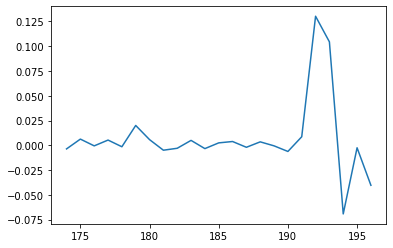

In [46]:
plt.plot(np.nanmean(CompCorron200Trials[:,2,50:151],1))

In [32]:
CompCorron200Trials.shape

(5000, 89, 201)

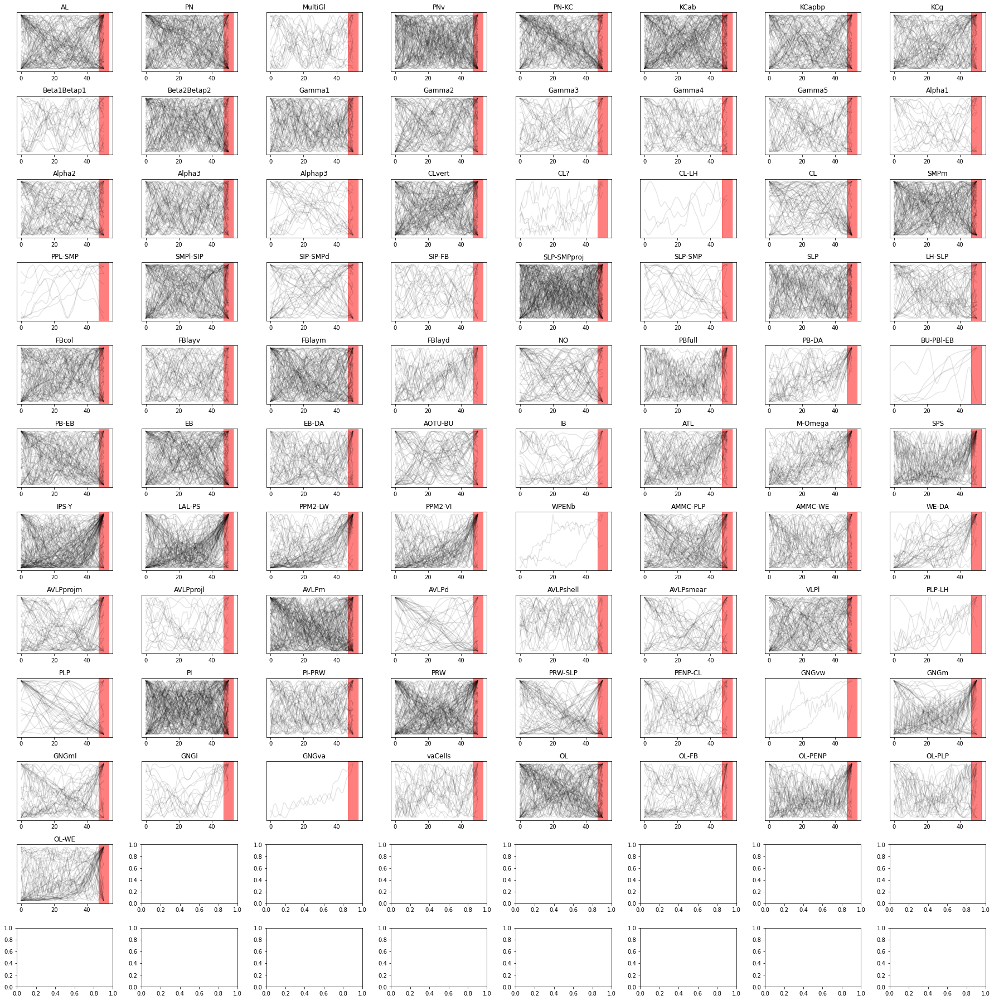

In [47]:
# Plot all trials
CompCorrOn=np.zeros((len(CompOrder),201))
fig, axs = plt.subplots(12, 8,figsize=(25,25))
j=0
for l in range(len(CompOrder)):
    if sum(Trials[:,l])>1:
        for k in range(int(kall)):
            C=CompCorron200Trials[k,l,50:101]
            if (np.nanmax(C)-np.nanmin(C))!=0:
                CompCorron200Trialn=(C-np.nanmin(C))/(np.nanmax(C)-np.nanmin(C))            
                axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].plot(CompCorron200Trialn,alpha=0.1,color='black')
        axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].set_title(CompOrder[0][l]) 
        #axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].axvline(x=50)
        axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].axvspan(50-3, 50+3, alpha=0.5, color='red')
        axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].get_yaxis().set_visible(False)

        j=j+1
#    except:
  #       continue   
plt.tight_layout()
plt.show()

In [49]:
plt.rcParams['axes.facecolor'] = 'white'

In [50]:
nFlies

array([30., 65.,  4., 40., 20., 50., 16., 11.,  3., 15.,  8.,  7.,  4.,
        7.,  3.,  0.,  1.,  6.,  7.,  2.,  0., 12.,  1.,  1.,  8., 12.,
        0.,  1., 23.,  3.,  6.,  0., 79.,  1., 11.,  6., 26.,  7.,  8.,
        5.,  4.,  3., 10.,  3.,  1., 27., 22.,  4., 13.,  7.,  8.,  6.,
       17., 27., 28., 10.,  9.,  2., 21., 27.,  3.,  0.,  8.,  2., 32.,
        1.,  8.,  5., 18.,  4.,  1., 38.,  9., 19.,  7.,  4.,  2.,  5.,
       12.,  2.,  3.,  2.,  4., 93.,  0.,  4., 10.,  8.,  7.,  0.,  0.,
        0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
        0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
        0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
        0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
        0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
        0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
        0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0

In [51]:
Trials.shape

(44, 89)

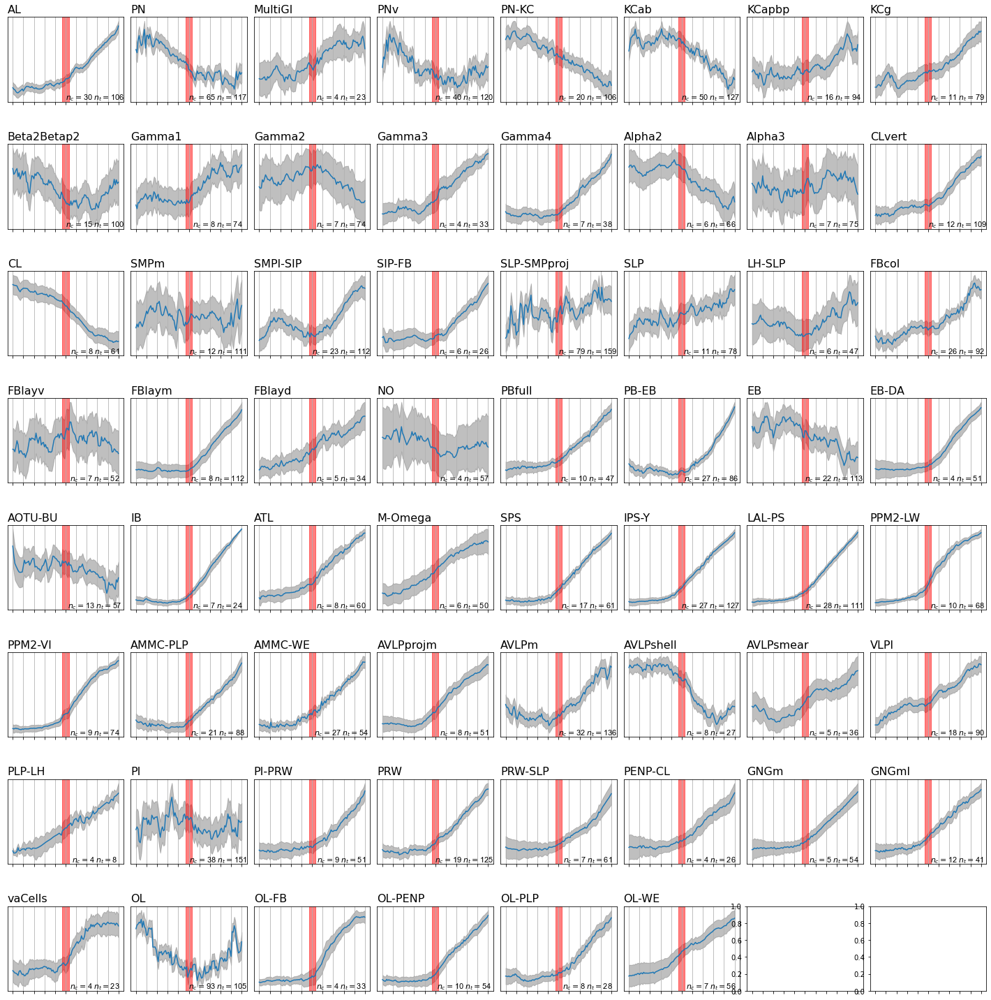

In [52]:
# Plot trial average
CompCorrOn=np.zeros((len(CompOrder),201))
fig, axs = plt.subplots(8, 8,figsize=(20,20),sharex=True)
l=0
for j in range(len(CompOrder)):
    if sum(Trials[:,j])>3 and nFlies[j]>3:
        
        #err=np.nanstd(CompCorron200Trialn[:,j,:],axis=0)/np.sqrt(sum(Trials[:,j])-1)
        err=np.nanstd(CompCorron200Trialn[:,j,:],axis=0)/np.sqrt(nFlies[j]-1)
        axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].plot(np.nanmedian(CompCorron200Trialn[:,j,:],axis=0))
        #axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].plot(err+np.nanmean(CompCorron200n[:,j,:],axis=0))
       # axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].plot(np.nanmean(CompCorron200n[:,j,:],axis=0)-err)
        axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].set_title(CompOrder[0][j],fontsize=16,loc='left')    
       # axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].fill_between((np.nanmean(CompCorron200n[:,j,:],axis=0)-err), (np.nanmean(CompCorron200n[i,j,:],axis=0)+err),color='grey',alpha=0.5)  
        axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].fill_between(range(101),np.nanmedian(CompCorron200Trialn[:,j,:],axis=0)-err,err+np.nanmedian(CompCorron200Trialn[:,j,:],axis=0),color='grey',
                     alpha=0.5)  
        #axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].get_xaxis().set_visible(False)
        axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].get_yaxis().set_visible(False)
        axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].text(0.75, 0.05, '$n_c=$'+str(int(nFlies[j]))+' $n_t=$'+ str(int(sum(Trials[:,j]))), fontsize=11,fontname="Arial",horizontalalignment='center', verticalalignment='center', transform=axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].transAxes)

        axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].axvspan(50-3, 50+3, alpha=0.5, color='red')
        axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].set_xticks([0,10,20,30,40,50,60,70,80,90,100])
        axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].set_xticklabels([])
        axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].xaxis.grid()
        for tic in axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].xaxis.get_major_ticks():
            tic.tick1On = tic.tick2On = False
        l=l+1

    #print(np.nanmax(CompCorrOnOff[j,:]))
plt.tight_layout()    
plt.subplots_adjust(wspace=0.06,hspace=0.5)
plt.savefig('Z:\GrunwaldKadow_group\Sophie\WalkProject\Figures\Figure6\Fig6CorronComponentsTrialsAv_sup30Hz.svg')
plt.savefig('Z:\GrunwaldKadow_group\Sophie\WalkProject\Figures\Figure6\Fig6CorronComponentsTrialsAv_sup30Hz.png')
plt.show() 


216
100761
100762
100106
B43
B193
B194
B195
B196
100148
981
100133
216
100761
104
100106
B43
B180
B193
B194
B195
100148
981
100133
100160
100597
100621
100761
100762
104
100106
B43
B193
B194
B195
B196
100148
981
100133
100160
B132
B134
100761
100762
103
104
100106
B43
B180
B193
B194
100148
100133
100160
216
100761
100762
103
100106
B43
B180
B193
B194
B195
B196
100148
981
100133
103
104
B180
B193
B194
B195
B196
100148
100133
100762
100148
981
100133
100160
107
46
216
100106
981
107
100142
100455
100597
100621
46
107
100142
100455
100597
100621
46
107
100142
100455
100597
100621
46
100160
107
100621
46
107
100455
100621
46
107
100597
46
46
107
100142
100597
100621
46
100160
B132
107
100142
100597
100621
46
107
100142
100106
981
100133
107
100597
100621
46
B132
B123
B193
981
100133
216
103
104
100106
B180
B193
100148
100133
B132
100142
100455
216
103
981
100133
100160
B132
B134
107
100142
100621
100133
107
216
104
981
B123
216
104
100106
B180
B193
B194
B195
B196
100148
981
100133
100160
1

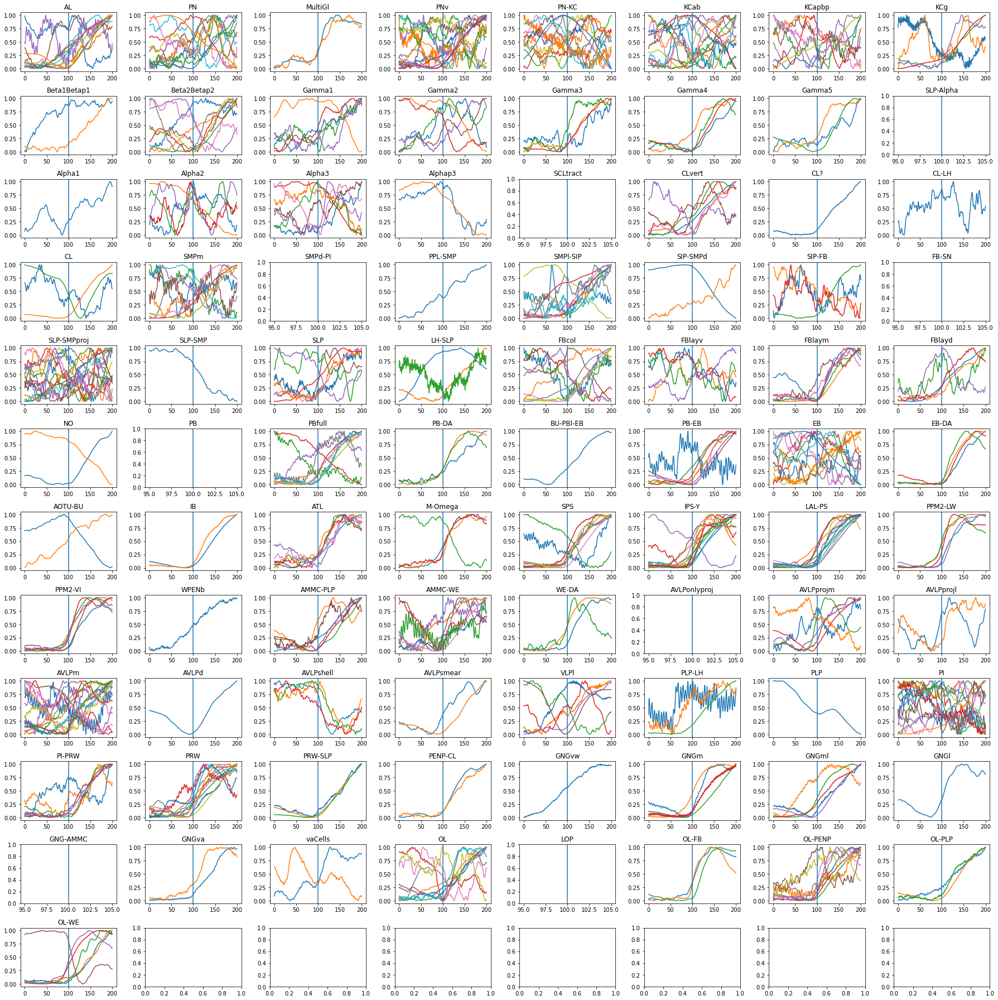

In [57]:
# Plot all flies

CompCorrOn=np.zeros((len(CompOrder),201))
fig, axs = plt.subplots(12, 8,figsize=(25,25))
for j in range(len(CompOrder)):
#for j in range(11,15):
    for i in range(GoodICFiles.shape[0]):
        if (np.nanmax(CompCorron200[i,j,:])-np.nanmin(CompCorron200[i,j,:]))!=0:
            #print(GoodICFiles.iloc[i]['expID'])
            CompCorrOn[j,:]=CompCorrOn[j,:]+Trials[i,j]*(CompCorron200[i,j,:]-np.nanmin(CompCorron200[i,j,:]))/(np.nanmax(CompCorron200[i,j,:])-np.nanmin(CompCorron200[i,j,:]))
            CompCorron200n[i,j,:]=Trials[i,j]*(CompCorron200[i,j,:]-np.nanmin(CompCorron200[i,j,:]))/(np.nanmax(CompCorron200[i,j,:])-np.nanmin(CompCorron200[i,j,:]))
            FRs[i,j]=GoodICFiles.iloc[i]['FR']
            axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].plot((CompCorron200[i,j,:]-np.nanmin(CompCorron200[i,j,:]))/(np.nanmax(CompCorron200[i,j,:])-np.nanmin(CompCorron200[i,j,:])))
    axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].set_title(CompOrder[0][j]) 
    axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].axvline(x=100)

#    except:
  #       continue   
plt.tight_layout()
plt.show()

In [54]:
CompCorrOnOff=np.zeros((len(CompOrder),201))
for i in range(GoodICFiles.shape[0]):
    for j in range(len(CompOrder)):
        CompCorrOnOff[j,:]=CompCorrOnOff[j,:]+CompCorronoff200[i,j,:]
#    except:
  #       continue      

In [55]:
CompCorrOff=np.zeros((len(CompOrder),201))
for i in range(GoodICFiles.shape[0]):
    for j in range(len(CompOrder)):
        CompCorrOff[j,:]=CompCorrOff[j,:]+CompCorroff200[i,j,:]
#    except:
  #       continue      

In [56]:
CompCorron200n[CompCorron200n==0]=np.nan

ValueError: The truth value of an array with more than one element is ambiguous. Use a.any() or a.all()

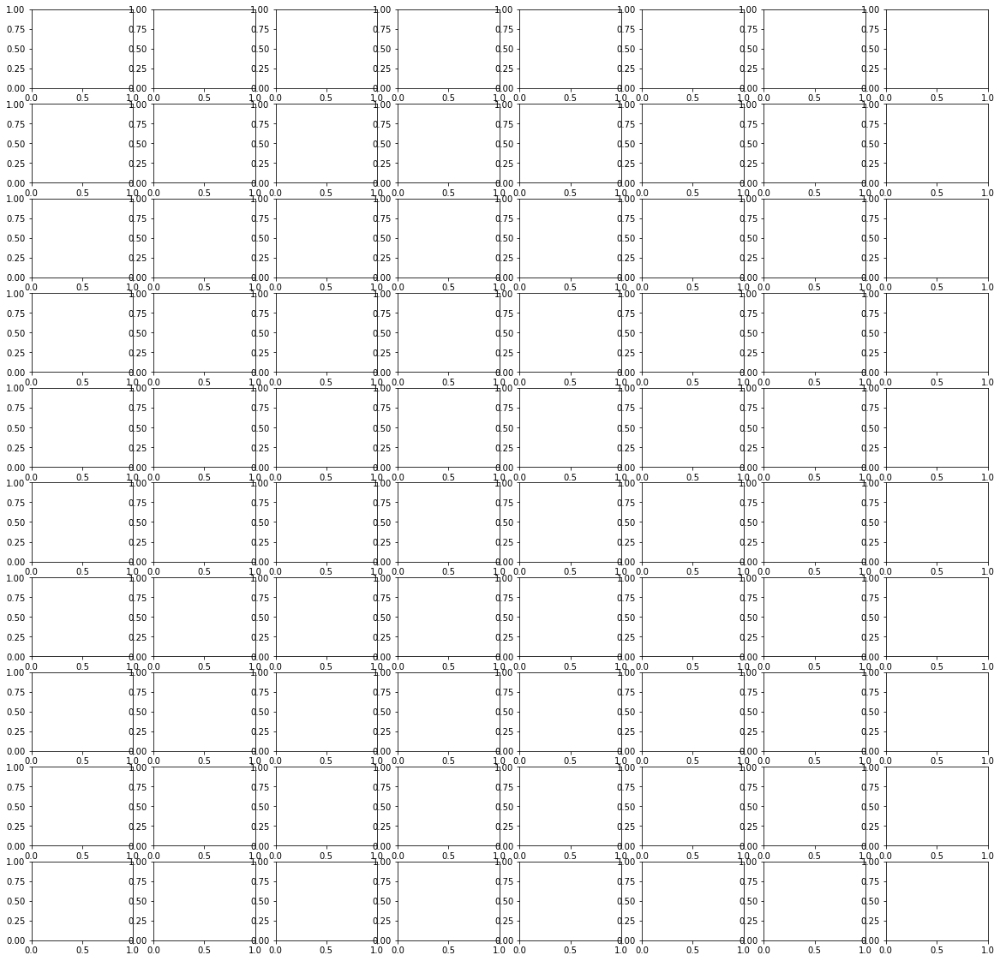

In [63]:
fig, axs = plt.subplots(10, 8,figsize=(20,20))
j=0
for l in range(len(CompOrder)):
    if Trials[l]>4:
        err=np.nanstd(CompCorron200n[:,l,:],axis=0)/np.sqrt(k[l]-1)
        axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].plot(np.nanmean(CompCorron200n[:,l,:],axis=0))
        #axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].plot(err+np.nanmean(CompCorron200n[:,j,:],axis=0))
       # axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].plot(np.nanmean(CompCorron200n[:,j,:],axis=0)-err)
        axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].set_title(CompOrder[0][l],fontsize=20) 
        axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].axvline(x=100-2.5)
        axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].axvline(x=100+2.5)        
       # axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].fill_between((np.nanmean(CompCorron200n[:,j,:],axis=0)-err), (np.nanmean(CompCorron200n[i,j,:],axis=0)+err),color='grey',alpha=0.5)  
        axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].fill_between(range(201),np.nanmean(CompCorron200n[:,l,:],axis=0)-err,err+np.nanmean(CompCorron200n[:,l,:],axis=0),color='grey',
                     alpha=0.5)  
        
        axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].get_xaxis().set_visible(False)
        axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].get_yaxis().set_visible(False)
        j=j+1
    #print(np.nanmax(CompCorrOnOff[j,:]))
plt.tight_layout()    
plt.savefig('Z:\GrunwaldKadow_group\Sophie\WalkProject\Figures\Figure6\Fig6CorronComponents_sup20Hz.svg')
plt.show()  

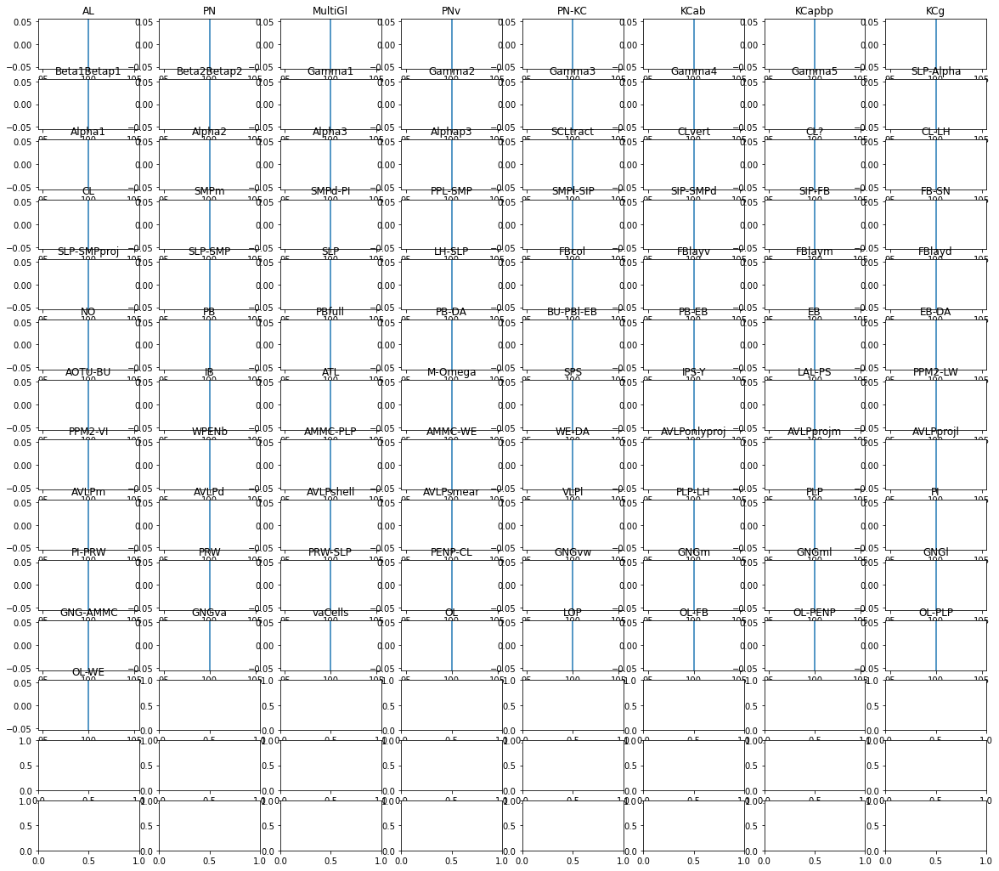

In [58]:
fig, axs = plt.subplots(14,8,figsize=(20,18))
for j in range(len(CompOrder)):
    axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].plot(CompCorrOff[j,:]/np.nanmax(CompCorrOff[j,:]))
    axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].set_title(CompOrder[0][j]) 
    axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].axvline(x=100)
plt.show()  

# PCA onset times

Are there different types of activity when starting to walk?

In [178]:
CompOrder[0][1]

'PN'

In [325]:
for j in range(20):
    print(j,CompOrder[0][j])

0 AL
1 PN
2 MultiGl
3 PNv
4 PN-KC
5 KCab
6 KCapbp
7 KCg
8 Beta1Betap1
9 Beta2Betap2
10 Gamma1
11 Gamma2
12 Gamma3
13 Gamma4
14 Gamma5
15 SLP-Alpha
16 Alpha1
17 Alpha2
18 Alpha3
19 Alphap3


In [59]:
CompCorron200Trialn.shape

(300, 89, 101)

In [341]:
A=CompCorron200Trialn[:,12,:]-0.5
A=A[np.isnan(np.nanmean(A,1))==False]

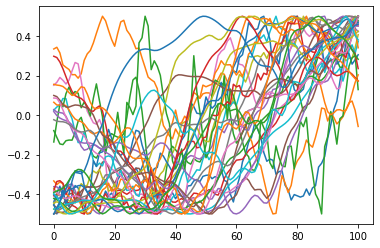

In [342]:
plt.plot(A.T)

In [60]:
u, s, vh = np.linalg.svd(A)

LinAlgError: SVD did not converge

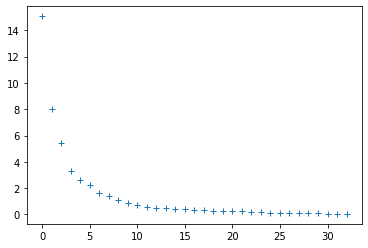

In [344]:
plt.plot(s,'+')

In [345]:
np.mean(u[:,1])

0.00156867235144059

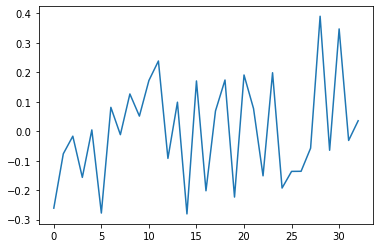

In [346]:
plt.plot(u[:,1])

In [347]:
s[2]

5.463955433570459

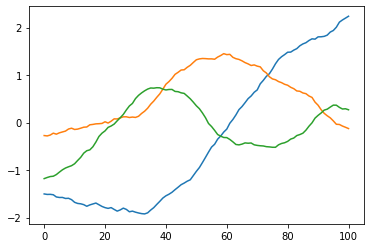

In [348]:
#plt.plot(s[0]*vh[0,:])
plt.plot(np.sign(np.mean(u[:,0]))*s[0]*vh[0,:])
plt.plot(np.sign(np.mean(u[:,1]))*s[1]*vh[1,:])
plt.plot(np.sign(np.mean(u[:,2]))*s[2]*vh[2,:])
#plt.plot(np.sign(np.mean(u[:,3]))*s[3]*vh[3,:])
#plt.plot(np.sign(np.mean(u[:,4]))*s[4]*vh[5,:])

In [349]:
CompCorron200Trials[:,1,50:151]

array([[-0.01000306, -0.01122026, -0.01037726, ..., -0.00510383,
        -0.00698053, -0.00700571],
       [-0.40603333, -0.41356254, -0.41574235, ..., -0.19827851,
        -0.20479335, -0.21846537],
       [ 0.01994106,  0.0195851 ,  0.01851728, ...,  0.01701752,
         0.01339361,  0.00910399],
       ...,
       [        nan,         nan,         nan, ...,         nan,
                nan,         nan],
       [        nan,         nan,         nan, ...,         nan,
                nan,         nan],
       [        nan,         nan,         nan, ...,         nan,
                nan,         nan]])

 ...]

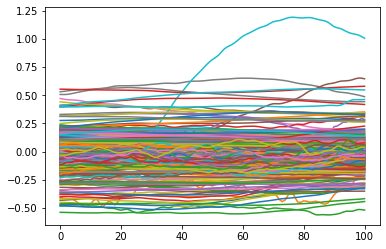

In [350]:
plt.plot(CompCorron200Trials[:,1,50:151].T)

In [351]:
# k-means

## Correlation convolved components

In [ ]:
Corr200Comp=np.zeros((GoodICFiles.shape[0],len(CompOrder),200))

In [ ]:
xnew = np.linspace(-1, 1, num=200, endpoint=True)

for i in range(GoodICFiles.shape[0]):
   # try:
        if GoodICFiles.iloc[i]['WalkRegressor'] != '':

            TS=loadmat(GoodICFiles.iloc[i]['TSfile'].replace('/','\\').replace('\\media\\NAS','Z:\\GrunwaldKadow_group').replace('.mat','GoodIC.mat'))['TSgoodIC']

            Regressor=loadmat(GoodICFiles.iloc[i]['WalkRegressor'])['Rkd']
            
            if Regressor.shape[0]<Regressor.shape[1]:
                Regressor=Regressor.T
            if TS.shape[0]>TS.shape[1]:
                TS=TS.T            
            if TS.shape[1]==(Regressor.shape[0]+2):
                TS=TS[:,1:Regressor.shape[0]+1]
            if TS.shape[1]==(Regressor.shape[0]+1):
                TS=TS[:,1:Regressor.shape[0]]            
            if TS.shape[1]==(Regressor.shape[0]+3):
                TS=TS[:,2:Regressor.shape[0]-1]    
            if TS.shape[1]==(Regressor.shape[0]-1):
                Regressor=Regressor[1:Regressor.shape[0]]    

            if TS.shape[1]==(Regressor.shape[0]-2):
                Regressor=Regressor[1:Regressor.shape[0]-1]    
            if TS.shape[1]==(Regressor.shape[0]-3):
                Regressor=Regressor[2:Regressor.shape[0]-1] 
            if TS.shape[1]==(Regressor.shape[0]-4):
                Regressor=Regressor[2:Regressor.shape[0]-2]    
            if TS.shape[1]==(Regressor.shape[0]-5):
                Regressor=Regressor[2:Regressor.shape[0]-3]                  
            if TS.shape[1]==(Regressor.shape[0]+6):
                TS=TS[:,3:TS.shape[1]-3]   
            if TS.shape[1]==(Regressor.shape[0]-11):
                Regressor=Regressor[5:Regressor.shape[0]-6]  
            if TS.shape[1]<Regressor.shape[0]:    
                Regressor=Regressor[int(GoodICFiles.iloc[i]['TSlowlimWalk']):int(GoodICFiles.iloc[i]['TShighlimWalk']+1)]     
            if TS.shape[1]>Regressor.shape[0]:    
                TS=TS[:,int(GoodICFiles.iloc[i]['TSlowlimWalk']):int(GoodICFiles.iloc[i]['TShighlimWalk']+1)]
           
            if TS.shape[1]==(Regressor.shape[0]-1):
                Regressor=Regressor[1:Regressor.shape[0]]    
            if TS.shape[1]==(Regressor.shape[0]+2):
                TS=TS[:,1:Regressor.shape[0]+1]
            if TS.shape[1]==(Regressor.shape[0]+1):
                TS=TS[:,0:Regressor.shape[0]] 

            FR=GoodICFiles.iloc[i]['FR']
            if len(TS)!=1:
                            #get onset
               
                    
                    
                for j in range(len(TS)):
                    
                #for j in range(2):      
                    if np.isnan(np.mean(TS[j,:]))==False:
                        RegName=Compdf.loc[(Compdf.TSfile == GoodICFiles.iloc[i]['TSfile']) & (Compdf.CompNum == j),['CompID']]
                        
                        Corr=scipy.signal.correlate(TS[j,:],np.squeeze(Regressor.T))
                        Corrloc=Corr[int((len(Corr+1)/2)-FR):int((len(Corr+1)/2)+FR+1)]
                        x = np.linspace(-1, 1, num=len(Corrloc), endpoint=True)
                        Corrlocint=scipy.interpolate.interp1d(x,Corrloc, kind='cubic')
                        Corr200Comp[i,CompOrder.index(RegName),:]=Corr200Comp[i,NameList.index(RegName),:]+Corrlocint(xnew)
                        
                        
                del TS
                
   # except:
    #     continue   
                    # Regress here, cross corr...

In [ ]:
np.save('CompCorrCov.npy',Corr200Conv)

# KMeans

In [62]:
from sklearn.cluster import KMeans, DBSCAN, AffinityPropagation

In [64]:
kmeans = KMeans(n_clusters=2, random_state=0).fit(CompCorron200Trialn[:,1,:])
plt.plot(kmeans.cluster_centers_.T)

ValueError: Input contains NaN, infinity or a value too large for dtype('float64').

In [374]:
dbscan =DBSCAN(eps=0.000001).fit(A)
dbscan.components_

In [381]:
afprop =AffinityPropagation(random_state=2).fit(A)

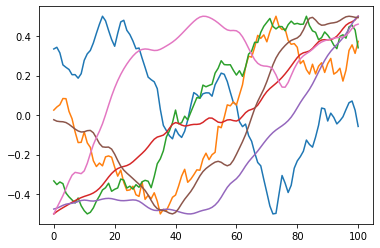

In [382]:
plt.plot(afprop.cluster_centers_.T)


In [363]:
np.mean(kmeans.labels_)

1.5454545454545454

In [64]:
Cnonnan.shape

(5000,)

In [88]:
np.isnan(Cnonnan).any(axis=1).shape

(5000,)

In [96]:
Cnonnan=CompCorron200Trials[:,0,50:101]
Cnonnan[~np.isnan(Cnonnan).any(axis=1),:].shape

(106, 51)

In [97]:
Cnonnan2.shape

(106, 51)

In [148]:
Cnonnan=CompCorron200Trials[:,:,50:101]

In [152]:
np.isnan(Cnonnan).any(axis=1).shape

(5000, 51)

In [151]:
Cnonnan[:,~np.isnan(Cnonnan).any(axis=1),:].shape

IndexError: too many indices for array: array is 3-dimensional, but 4 were indexed

In [340]:
Cnonnan2.shape

(57, 51)

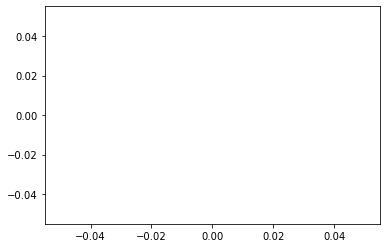

In [381]:
Cnonnanb=CompCorron200Trials[:,39,50:101]
Cnonnan2b=Cnonnanb[~np.isnan(Cnonnan).any(axis=1),:]
plt.plot(Cnonnan2b[kmeans2.labels_==0,:].mean(axis=0),'r')
plt.plot(Cnonnan2b[kmeans2.labels_==1,:].mean(axis=0),'g')
plt.plot(Cnonnan2b[kmeans2.labels_==2,:].mean(axis=0),'b')

In [362]:
Cnonnan2.shape

(57, 51)

In [378]:
Cnonnan=CompCorron200Trials[:,1,50:101]
Cnonnan2=Cnonnan[~np.isnan(Cnonnan).any(axis=1),:]
for n in range(Cnonnan2.shape[0]):
    Cnonnan2[n,:]=Cnonnan2[n,:]-np.mean(Cnonnan2[n,:])
kmeans2 = KMeans(n_clusters=3, random_state=1).fit(Cnonnan2)

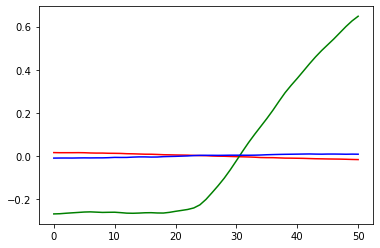

In [379]:
plt.plot(Cnonnan2[kmeans2.labels_==0,:].mean(axis=0),'r')
plt.plot(Cnonnan2[kmeans2.labels_==1,:].mean(axis=0),'g')
plt.plot(Cnonnan2[kmeans2.labels_==2,:].mean(axis=0),'b')

In [78]:
kmeans.labels_.shape

(5406,)

# Anatomical regions

In [4]:
NameList=sorted(Regionsdf['RegionNames'].unique())

In [ ]:
T87_75=loadmat('C:\\Users\\Soso\Documents\GitHub\FlyLFM\MatlabFiles\CompareConditions\87to75.mat')['VarName3']

In [6]:
Regionsdf=Regionsdf.query('FR>15')
Compdf=Compdf.query('FR>15')
GoodICFiles=GoodICFiles.query('FR>15')

In [14]:
Corron200Time=np.load('PANCorron200Time_sup15Hz.npy')
Corron200=np.load('PANCorron200_sup15Hz.npy')

Corron200Time[Corron200Time==0]=np.nan

plt.plot(np.nanmean(Corron200Time,axis=0))
plt.plot(np.nanstd(Corron200Time,axis=0))
#plt.xlabel(NamesList)

In [17]:
Corron200n=np.zeros((GoodICFiles.shape[0],41,201))
Corron200Trialn=np.zeros((int(max(sum(Trials))),41,201))
FRs=np.zeros((GoodICFiles.shape[0],87))

# Plot all trials
CorrOn=np.zeros((41,201))
fig, axs = plt.subplots(6, 8,figsize=(25,15))
for j in range(41):
    for k in range((int(max(sum(Trials))))):
        C=Corron200Trials[k,j,:]
        if (np.nanmax(C)-np.nanmin(C))!=0:
            Corron200Trialn[k,j,:]=(C-np.nanmin(C))/(np.nanmax(C)-np.nanmin(C))            
            axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].plot(Corron200Trialn[k,j,:])
    axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].set_title(NameList[j]) 
    axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].axvline(x=100)

#    except:
  #       continue   
plt.tight_layout()
plt.show()

(array([[1., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 1.],
        [1., 1., 0., ..., 0., 0., 0.],
        [2., 0., 0., ..., 0., 0., 0.]]),
 array([-1.        , -0.96360033, -0.92720066, -0.89080099, -0.85440132,
        -0.81800165, -0.78160198, -0.74520231, -0.70880264, -0.67240297,
        -0.6360033 , -0.59960363, -0.56320396, -0.52680429, -0.49040462,
        -0.45400495, -0.41760528, -0.38120561, -0.34480594, -0.30840627,
        -0.2720066 , -0.23560693, -0.19920726, -0.16280759, -0.12640792,
        -0.09000825, -0.05360858, -0.01720891,  0.01919076,  0.05559043,
         0.0919901 ,  0.12838977,  0.16478944,  0.20118911,  0.23758878,
         0.27398845,  0.31038812,  0.34678779,  0.38318746,  0.41958713,
         0.4559868 ,  0.49238647,  0.52878614,  0.56518581,  0.60158548,
         0.63798515,  0.67438482,  0.71078449,  0.74718417,  0.78358384,
         0.81998351])

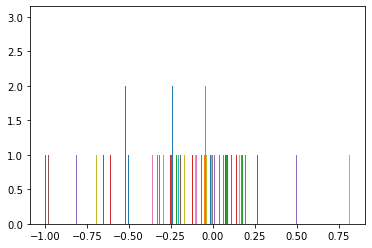

In [19]:
plt.hist(Corron200Time,50)
#plt.xlim(-0.1,0.1)

In [20]:
CorronPAN=np.zeros((41,201,GoodICFiles.shape[0]))

fig, axs = plt.subplots(6, 8,figsize=(20,18))
k=np.zeros((41))
for i in range(GoodICFiles.shape[0]):
        for j in range(41):
            if any(Corron200[i,j,:]!=np.nan) and (np.nanmax(Corron200[i,j,:])-np.nanmin(Corron200[i,j,:]))!=0:
                CorronPAN[j,:,int(k[j])]=(Corron200[i,j,:]-np.nanmin(Corron200[i,j,:]))/(np.nanmax(Corron200[i,j,:])-np.nanmin(Corron200[i,j,:]))
                axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].plot((Corron200[i,j,:]-np.nanmin(Corron200[i,j,:]))/(np.nanmax(Corron200[i,j,:])-np.nanmin(Corron200[i,j,:])))
                axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].set_title(NameList[j]) 
                axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].axvline(x=100)
                k[j]=k[j]+1
plt.show()  

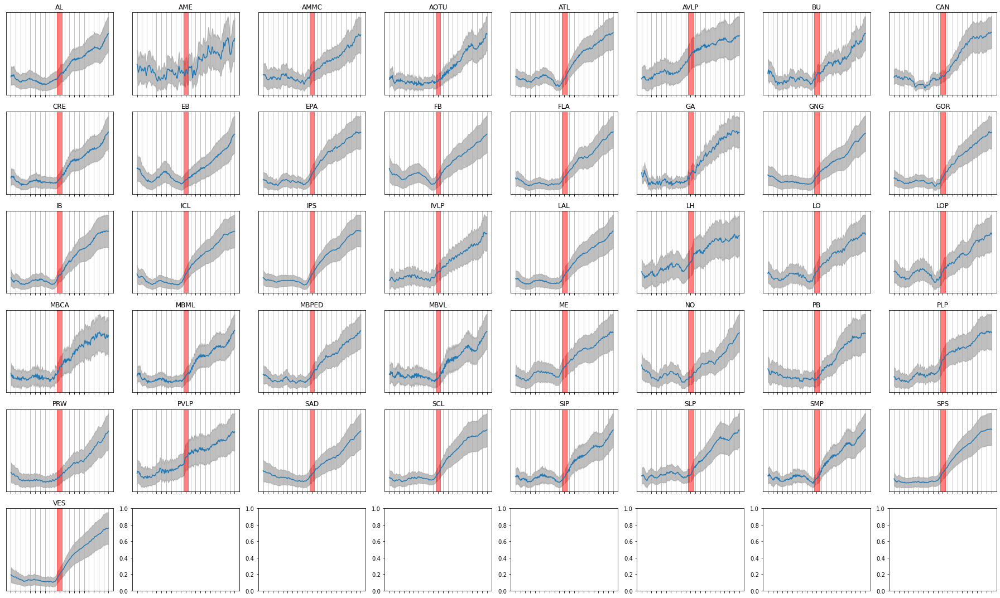

In [33]:
# Plot trial average
CorrOn=np.zeros((41,201))
d=8
fig, axs = plt.subplots(6,d,figsize=(25,15),sharex=True)
l=0
for j in range(41):
    if sum(Trials[:,j])>5:
        err=np.nanstd(Corron200Trialn[:,j,:],axis=0)/np.sqrt(sum(Trials[:,j])-1)
        axs[int(np.floor(l/d)),l-int(np.floor(l/d)*d)].plot(np.nanmean(Corron200Trialn[:,j,:],axis=0))
        #axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].plot(err+np.nanmean(CompCorron200n[:,j,:],axis=0))
       # axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].plot(np.nanmean(CompCorron200n[:,j,:],axis=0)-err)
        axs[int(np.floor(l/d)),j-int(np.floor(l/d)*d)].set_title(NameList[j])     
       # axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].fill_between((np.nanmean(CompCorron200n[:,j,:],axis=0)-err), (np.nanmean(CompCorron200n[i,j,:],axis=0)+err),color='grey',alpha=0.5)  
        axs[int(np.floor(l/d)),l-int(np.floor(l/d)*d)].fill_between(range(201),np.nanmean(Corron200Trialn[:,j,:],axis=0)-err,err+np.nanmean(Corron200Trialn[:,j,:],axis=0),color='grey',
                     alpha=0.5)  
        #axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].get_xaxis().set_visible(False)
        axs[int(np.floor(l/d)),l-int(np.floor(l/d)*d)].get_yaxis().set_visible(False)
        axs[int(np.floor(l/d)),l-int(np.floor(l/d)*d)].axvspan(100-5, 100+5, alpha=0.5, color='red')
        axs[int(np.floor(l/d)),l-int(np.floor(l/d)*d)].set_xticks([0,10,20,30,40,50,60,70,80,90,100,110,120,130,140,150,160,170,180,190,200])
        axs[int(np.floor(l/d)),l-int(np.floor(l/d)*d)].set_xticklabels([])
        axs[int(np.floor(l/d)),l-int(np.floor(l/d)*d)].xaxis.grid()
        #axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].set_xlim(50,151)
        for tic in axs[int(np.floor(l/d)),l-int(np.floor(l/d)*d)].xaxis.get_major_ticks():
            tic.tick1On = tic.tick2On = False

        l=l+1

    #print(np.nanmax(CompCorrOnOff[j,:]))
plt.tight_layout()    
plt.savefig('Z:\GrunwaldKadow_group\Sophie\WalkProject\Figures\Figure6\Fig6PANCorrononentsTrialsAv_sup15Hz.svg')
plt.savefig('Z:\GrunwaldKadow_group\Sophie\WalkProject\Figures\Figure6\Fig6PANCorrononentsTrialsAv_sup15Hz.png')
plt.show() 


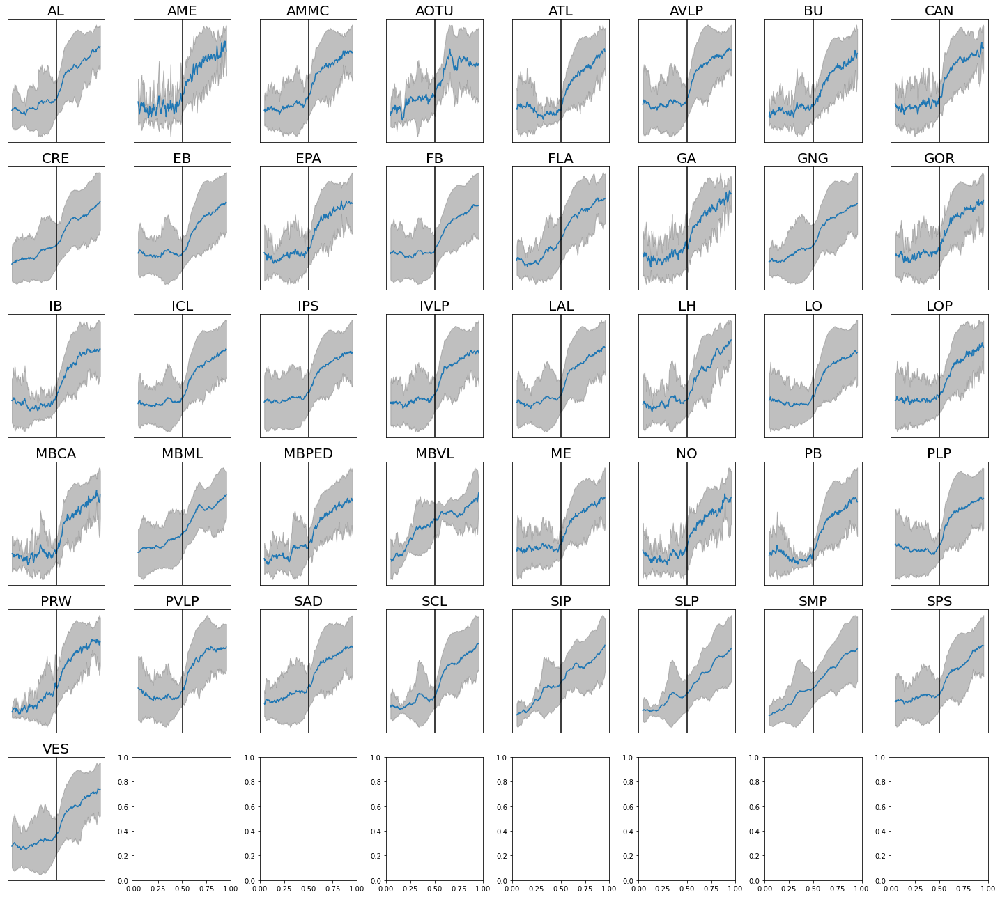

In [27]:
fig, axs = plt.subplots(6, 8,figsize=(20,18))
for j in range(41):
    axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].plot(np.nanmean(CorronTH[j,:,:],axis=1))
    err=np.nanstd(CorronTH[j,:,:],axis=1)
    axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].set_title(NameList[j],size=20) 
    axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].axvline(x=100, color='black')
    axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].fill_between(range(200),np.nanmean(CorronTH[j,:,:],axis=1)-err, np.nanmean(CorronTH[j,:,:],axis=1)+err,color='grey',
                 alpha=0.5)  
    axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].get_xaxis().set_visible(False)
    axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].get_yaxis().set_visible(False)
plt.tight_layout()
plt.savefig('Z:\GrunwaldKadow_group\Sophie\WalkProject\Figures\Figure6\CorronTH_sup20Hz.svg')
plt.show()  

In [ ]:
DeltaTime=np.zeros((271,41))
k=np.zeros((41))
for i in range(GoodICFiles.shape[0]):
    for j in range(41):
        DeltaTime[i,j]=Corron200Time[i,j]-Corron200Time[i,14]
    if np.mean(DeltaTime[i,j])<0:
        print(GoodICFiles.iloc[i]['GAL4'])
DeltaTime[DeltaTime==0]=np.nan        
plt.hist(DeltaTime)

# Functionally defined anatomical regions

In [19]:
NameList=['ALdm','ALd','ALvm','ALal','Gamma1','Gamma2','Gamma3','Gamma4','Gamma5','Beta1','beta2','Alpha2','Alpha3','CAl','CAm','PI','SMPm','SMPplproj','SMPlvp','SMPlda','SIPd','SLPpv','SLPpd','SLPa','LHdm','LHvm','LHvl','LHl','LHdl','Sup.Cl.','InferiorClamp','IB-Antl','FBd','FBl','FBv','EBp','EBa','PBp','PBm','PBl','PBml','LAL','PRW','Saddle','AMMCa','AMMCp','GNGm','GNGav','GNGv','GNGdam','GNGdl','GNGlda','GNGvl','GNGm','Vest','SPSm','SPSl','SPSdl','IPS','AVLPm','AVLPav','AVLPabulk','AVLPaav','AVLPl','AVLPd','AVLPpv','AVLPpbulk','AVLPdm','Wedgea','Wedgep','PLPd','PLPdp','PLPpl','LO','OL','ALdm','ALd','ALvm','ALal','Gamma1','Gamma2','Gamma3','Gamma4','Gamma5','Beta1','beta2','Alpha2','Alpha3','CAl','CAm','PI','SMPm','SMPplproj','SMPlvp','SMPlda','SIPd','SLPpv','SLPpd','SLPa','LHdm','LHvm','LHvl','LHl','LHdl','Sup.Cl.','InferiorClamp','IB-Antl','FBd','FBl','FBv','EBp','EBa','PBp','PBm','PBl','PBml','LAL','PRW','Saddle','AMMCa','AMMCp','GNGm','GNGav','GNGv','GNGdam','GNGdl','GNGlda','GNGvl','GNGm','Vest','SPSm','SPSl','SPSdl','IPS','AVLPm','AVLPav','AVLPabulk','AVLPaav','AVLPl','AVLPd','AVLPpv','AVLPpbulk','AVLPdm','Wedgea','Wedgep','PLPd','PLPdp','PLPpl','LO','OL'];

In [43]:
NameList[32]

'FBd'

In [20]:
Regionsdf=pd.read_pickle("Z:\GrunwaldKadow_group\Sophie\WalkProject\Regionsdf.pkl")
GoodICFiles=pd.read_pickle("Z:\GrunwaldKadow_group\Sophie\WalkProject\GoodICsdf.pkl")

In [39]:
# Compdf=pd.read_pickle("Z:\GrunwaldKadow_group\Sophie\WalkProject\Compdf.pkl")
# GoodICFiles=pd.read_pickle("Z:\GrunwaldKadow_group\Sophie\WalkProject\GoodICsdf.pkl")
# Regionsdf=pd.read_pickle("Z:\GrunwaldKadow_group\Sophie\WalkProject\Regionsdf.pkl")

# GoodICFiles.loc[GoodICFiles.index==0,'TSlowlimWalk']=0
# GoodICFiles.loc[GoodICFiles.index==0,'TShighlimWalk']=4999
# GoodICFiles.loc[GoodICFiles.index==24,'TSlowlimWalk']=2
# GoodICFiles.loc[GoodICFiles.index==24,'TShighlimWalk']=4998
# GoodICFiles.loc[GoodICFiles.index==126,'TSlowlimWalk']=1
# GoodICFiles.loc[GoodICFiles.index==130,'TSlowlimWalk']=1
# GoodICFiles.loc[GoodICFiles.index==130,'TShighlimWalk']=3000

GoodICFiles.loc[GoodICFiles['expID']=='B377','FR']=10
GoodICFiles.loc[GoodICFiles['expID']=='B1055','FR']=5

In [4]:
GoodICFiles=GoodICFiles.query('GAL4 == "Nsyb" or GAL4 == "GMR57C10"')
Regionsdf=Regionsdf.query('GAL4 == "Nsyb" or GAL4 == "GMR57C10"')

Corronoff200=np.zeros((GoodICFiles.shape[0],41,201))
Corroff200=np.zeros((GoodICFiles.shape[0],41,201))
Corron200=np.zeros((GoodICFiles.shape[0],41,201))
Corron200Time=np.zeros((GoodICFiles.shape[0],41))
Regionsdf['OnTime']=np.nan
Corron200Trials=np.zeros((10000,41,201))
Trials=np.zeros((GoodICFiles.shape[0],41))

xnew = np.linspace(-1, 1, num=201, endpoint=True)
k=np.zeros(41)

#for i in chain(range(134), range(135, 244), range(245, GoodICFiles.shape[0])):
for i in range(GoodICFiles.shape[0]):
    #try:
        if GoodICFiles.iloc[i]['WalkRegressor'] != '':
            if (GoodICFiles.iloc[i]['RegionFile']!=''):
                TS=loadmat("C:\\Users\\Soso\\Desktop\\FuncRegionTS\\"+list(GoodICFiles.loc[GoodICFiles.index == i]['expID'])[0]+"_150FuncRegionsTS.mat")['TS']

                #TS=loadmat(GoodICFiles.iloc[i]['RegionFile'])['TS']
            #TS=loadmat(GoodICFiles.iloc[i]['TSfile'].replace('/','\\').replace('\\media\\NAS','Z:\\GrunwaldKadow_group').replace('.mat','GoodIC.mat'))['TSgoodIC']
            else:
                continue
            try:
                Regressor =loadmat(GoodICFiles.iloc[i]['WalkRegressor'].replace('kd',''))['R']
            except:
                try:
                    Regressor =loadmat(GoodICFiles.iloc[i]['WalkRegressor'].replace('kd',''))['Rwalk']
                except:
                    try:
                        Regressor =loadmat(GoodICFiles.iloc[i]['WalkRegressor'].replace('WalkRbinkd','Rbin'))['R']
                    except:
                        try:
                            Regressor =loadmat(GoodICFiles.iloc[i]['WalkRegressor'].replace('Rbinkd','Rbin'))['Rbin']
                        except:
                            Regressor =loadmat(GoodICFiles.iloc[i]['WalkRegressor'].replace('kd',''))['Rbin']
            
            if Regressor.shape[0]<Regressor.shape[1]:
                Regressor=Regressor.T
            if TS.shape[0]>TS.shape[1]:
                TS=TS.T    
                
            print(Regressor.shape, TS.shape)   
            
            if TS.shape[1]==(Regressor.shape[0]+2):
                TS=TS[:,1:Regressor.shape[0]+1]
            if TS.shape[1]==(Regressor.shape[0]+1):
                TS=TS[:,0:Regressor.shape[0]]            
            if TS.shape[1]==(Regressor.shape[0]+3):
                TS=TS[:,1:Regressor.shape[0]+1]   
                
            if TS.shape[1]==(Regressor.shape[0]-1):
                Regressor=Regressor[0:Regressor.shape[0]-1]    
            if TS.shape[1]==(Regressor.shape[0]-2):
                Regressor=Regressor[1:Regressor.shape[0]-1]    
            if TS.shape[1]==(Regressor.shape[0]-3):
                Regressor=Regressor[1:Regressor.shape[0]-2] 
            if TS.shape[1]==(Regressor.shape[0]-4):
                Regressor=Regressor[2:Regressor.shape[0]-2]                  
            if TS.shape[1]==(Regressor.shape[0]-6):
                Regressor=Regressor[3:Regressor.shape[0]-3]     
            if TS.shape[1]==(Regressor.shape[0]-5):
                Regressor=Regressor[2:Regressor.shape[0]-3]                     
            if TS.shape[1]==(Regressor.shape[0]+2):
                TS=TS[:,1:Regressor.shape[0]+1]                 
              
            if TS.shape[1]!=(Regressor.shape[0]): 
                TS=TS[:,int(GoodICFiles.iloc[i]['TSlowlimWalk']):int(GoodICFiles.iloc[i]['TShighlimWalk']+1)]
                
            if TS.shape[1]==(Regressor.shape[0]+2):
                TS=TS[:,1:Regressor.shape[0]+1]
            if TS.shape[1]==(Regressor.shape[0]+1):
                TS=TS[:,0:Regressor.shape[0]]            
            if TS.shape[1]==(Regressor.shape[0]+3):
                TS=TS[:,1:Regressor.shape[0]+1]   
                
            if TS.shape[1]==(Regressor.shape[0]-1):
                Regressor=Regressor[0:Regressor.shape[0]-1]    
            if TS.shape[1]==(Regressor.shape[0]-2):
                Regressor=Regressor[1:Regressor.shape[0]-1]    
            if TS.shape[1]==(Regressor.shape[0]-3):
                Regressor=Regressor[1:Regressor.shape[0]-2] 
            if TS.shape[1]==(Regressor.shape[0]-4):
                Regressor=Regressor[2:Regressor.shape[0]-2]                  
            if TS.shape[1]==(Regressor.shape[0]-6):
                Regressor=Regressor[3:Regressor.shape[0]-3]     
            if TS.shape[1]==(Regressor.shape[0]-5):
                Regressor=Regressor[2:Regressor.shape[0]-3]                     
            if TS.shape[1]==(Regressor.shape[0]+2):
                TS=TS[:,1:Regressor.shape[0]+1]     


            
            #if len(TS)!=1 and pd.isnull(FR)==False:
            if len(TS)!=1:
                FR=GoodICFiles.iloc[i]['FR']
                print(GoodICFiles.iloc[i]['expID'])
                           
                Ron=np.zeros(len(Regressor))
                Roff=np.zeros(len(Regressor))
                for m in range(int(1*FR),int(len(Regressor)-1*FR)):
                    if Regressor[m]==1 and all(Regressor[int(m-1*FR):int(m)]==0) and (np.mean(Regressor[int(m+1):int(m+0.5*FR)])>0.5):
                        Ron[m]=1                        
                    if Regressor[m]==1 and all(Regressor[int(m+1):int(m+1*FR)]==0) and (np.mean(Regressor[int(m-0.5*FR):int(m-1)])>0.5):
                        Roff[m+1]=1                    
                

                for j in range(75):    
                    if len(TS)==87:
                        TS2=TS
                        TS=np.zeros((75,TS.shape[1]))
                        for j in range(75):
                            TS[j,:]=TS2[T87_75[j][0]-1,:]  
                    
                    if np.isnan(np.mean(TS[j,:]))==False:
                        TS[j,:]=TS[j,:]/np.nanmax(TS[j,:])
                        Ton=[p for p in range(len(np.squeeze(Ron.T))) if Ron[p]==1]
                        
                        ## full correlation
                        Corr=np.correlate(TS[j,:],np.squeeze(Regressor.T), 'full')
                        Corrloc=Corr[int((len(Corr)-1)/2-FR):int((len(Corr)-1)/2+FR)+1]
                        x = np.linspace(-1, 1, num=len(Corrloc), endpoint=True)
                        Corrlocint=scipy.interpolate.interp1d(x,Corrloc, kind='cubic')
                        RegName=list(Regionsdf.loc[(Regionsdf.TSfile == GoodICFiles.iloc[i]['TSfile']) & (Regionsdf.RegionNum == j)]['RegionNames'])[0]
                        
                        Corronoff200[i,NameList.index(RegName),:]=Corronoff200[i,NameList.index(RegName),:]+Corrlocint(xnew)

                        ## onset correlation
                        Corr=np.correlate(TS[j,:],np.squeeze(Ron.T), 'full')
                        #lags = scipy.signal.correlation_lags(len(TS[j,:])/FR)
                        Corrloc=Corr[int((len(Corr)-1)/2-FR):int((len(Corr)-1)/2+FR)+1]
                        Corrloc50=Corr[int(((len(Corr)-1)/2)-FR):int(((len(Corr)-1)/2)+0.5*FR)+1]
                        x = np.linspace(-1, 1, num=len(Corrloc), endpoint=True)
                        x50 = np.linspace(-1, 0.5, num=len(Corrloc50), endpoint=True)
                        Corrlocint=scipy.interpolate.interp1d(x,Corrloc, kind='cubic')
                        
                        ## fit onset
                        y0=np.mean(Corrloc)
                        yb=np.max(Corrloc)
                        p , e = optimize.curve_fit(piecewise_linear, x50, Corrloc50,p0=[0.1,y0,0.001,yb-y0],bounds=([-0.5,y0-0.5*abs(y0)-1,-1,(yb-y0)-abs(yb-y0)-1],[0.5,(y0+0.5*abs(y0))+1,1,(yb-y0)+abs(yb-y0)+1]),method='trf')
                        residuals = Corrloc50- piecewise_linear(x50, *p)
                        ss_res = np.sum(residuals**2)
                        ss_tot = np.sum((Corrloc50-np.mean(Corrloc50))**2)
                        r_squared = 1 - (ss_res / ss_tot)
                        
                        Corron200[i,NameList.index(RegName),:]=Corron200[i,NameList.index(RegName),:]+Corrlocint(xnew)
                        Regionsdf.loc[(Regionsdf.TSfile == GoodICFiles.iloc[i]['TSfile']) & (Regionsdf.RegionNum == j),'OnTime']=p[0]
                        
                        if r_squared>0.9:
                            Corron200Time[i,NameList.index(RegName)]=Corron200Time[i,NameList.index(RegName)]+p[0]
                        
                        if j==20:
                            print(r_squared)
                            plt.plot(x,Corrloc)                            
                        ## get peri-onset time series per trial
                        for l in range(int(sum(Ron))):
                            Tloc=TS[j,int(Ton[l]-FR):int(Ton[l]+FR+1)]
                            #x = np.linspace(-1, 1, num=len(Tloc), endpoint=True)
                            Tlocint=scipy.interpolate.interp1d(x,Tloc, kind='cubic')
                            Corron200Trials[int(k[NameList.index(RegName)]+l),NameList.index(RegName),:]=Tlocint(xnew)
  
                            if j==20:
                                plt.plot(x,(Tloc-Tloc[0])*10)
                                plt.axvline(x=p[0])
                                xd = np.linspace(-1, 1, 100)
                                plt.plot(xd, piecewise_linear(xd, *p))
                        plt.show()   
                        k[NameList.index(RegName)]=k[NameList.index(RegName)]+sum(Ron)
                        Trials[i,NameList.index(RegName)]=sum(Ron) 
                        
                        
                        Corr=np.correlate(TS[j,:],np.squeeze(Roff.T), 'full')
                        Corrloc=Corr[int((len(Corr)-1)/2-FR):int((len(Corr)-1)/2+FR)+1]
                        x = np.linspace(-1, 1, num=len(Corrloc), endpoint=True)
                        Corrlocint=scipy.interpolate.interp1d(x,Corrloc, kind='cubic')
                        RegName=list(Regionsdf.loc[(Regionsdf.TSfile == GoodICFiles.iloc[i]['TSfile']) & (Regionsdf.RegionNum == j)]['RegionNames'])[0]
                        Corroff200[i,NameList.index(RegName),:]=Corroff200[i,NameList.index(RegName),:]+Corrlocint(xnew)

                del TS
                
   # except:
      #   continue   


Corron200Time[i,NameList.index(RegName)]=Corron200Time[i,NameList.index(RegName)]/(k[NameList.index(RegName)]+1)

np.save('PANFuncRegionsCorron200Time_sup15Hz.npy',Corron200Time)
np.save('PANFunRegionsCorron200_sup15Hz.npy',Corron200)

NameError: name 'NameList' is not defined

In [51]:
GoodICFiles.loc[GoodICFiles['expID']=='B362','ForcedWalkRegressor']="Z:\GrunwaldKadow_group\Sophie\WalkProject\TH\B361-B362-forced\B362_1_950Forcedkd.mat"

In [ ]:
# too noisy, identify onset by hand
Ron =np.zeros((5998,1))
Roff =np.zeros((5998,1))
Ron[211]=1
Ron[923]=1
Ron[2726]=1
Ron[3505]=1
Ron[5647]=1
savemat(GoodICFiles[GoodICFiles['expID']=='107']['WalkRegressor'].values.tolist()[0].replace('.mat','Ron_and_Roff.mat'),{"Ron": Ron.T, "Roff": Roff.T})

107
Z:\GrunwaldKadow_group\Sophie\WalkProject\TH\107\107Rbinkd.mat
C:\Users\Soso\Desktop\FuncRegionTS\107_150FuncRegionsTS.mat
(5999, 1)
(150, 5998)


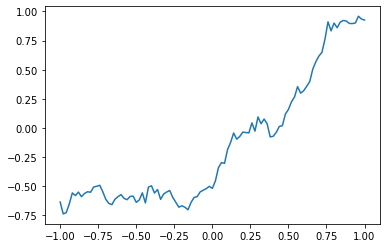

107
100142
Z:\GrunwaldKadow_group\Sophie\WalkProject\TH\100142\100142Rbinkd.mat
C:\Users\Soso\Desktop\FuncRegionTS\100142_150FuncRegionsTS.mat
(12435, 1)
(150, 6292)
100145
100405
100411
100455
Z:\GrunwaldKadow_group\Sophie\WalkProject\TH\100455Series\100455Walkbin1_5000Rkd.mat
C:\Users\Soso\Desktop\FuncRegionTS\100455_150FuncRegionsTS.mat
100597
Z:\GrunwaldKadow_group\Sophie\WalkProject\TH\100597series\100597Rbinkd.mat
C:\Users\Soso\Desktop\FuncRegionTS\100597_150FuncRegionsTS.mat
(1, 9500)
(150, 9500)


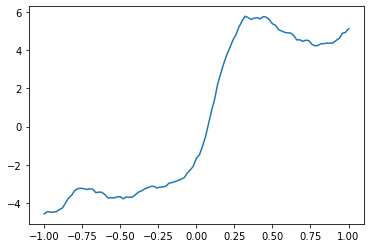

100597
100621
Z:\GrunwaldKadow_group\Sophie\WalkProject\TH\100621series\100621ss2seriesshortRbinkd.mat
C:\Users\Soso\Desktop\FuncRegionTS\100621_150FuncRegionsTS.mat
(1, 5990)
(150, 5990)


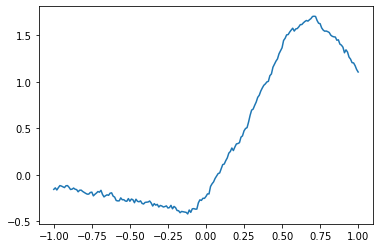

100621
B369
B370
B371
B372
B373
B374
B375
B376
B377
B378
46
Z:\GrunwaldKadow_group\Sophie\WalkProject\TH\Data46_47\46Rbinkd.mat
C:\Users\Soso\Desktop\FuncRegionTS\46_150FuncRegionsTS.mat
(1, 5858)
(150, 5857)


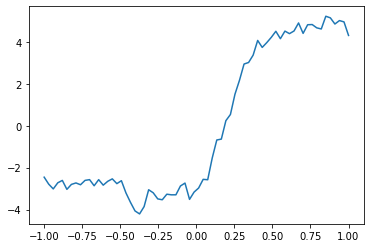

46
47
TUM42
TUM43
TUM45
B765
B766
B767
B768
B1054
B1055
28
29
158
167
B365
B361
B362


In [110]:
#GoodICFiles=GoodICFiles.query('GAL4 == "Nsyb" or GAL4 == "GMR57C10"')
line='TH'
GoodICFiles=GoodICFiles.query('GAL4 == "TH"')
Corronoff200=np.zeros((GoodICFiles.shape[0],75,201))
Corroff200=np.zeros((GoodICFiles.shape[0],75,201))
Corron200=np.zeros((GoodICFiles.shape[0],75,201))
Corron200Time=np.zeros((GoodICFiles.shape[0],75))
Corron200Trials=np.zeros((10000,75,201))
Trials=np.zeros((GoodICFiles.shape[0],75))

xnew = np.linspace(-1, 1, num=201, endpoint=True)
k=np.zeros(75)

#for i in chain(range(134), range(135, 244), range(245, GoodICFiles.shape[0])):
for i in range(GoodICFiles.shape[0]):
    try:
        print(GoodICFiles.iloc[i]['expID'])
        FR=GoodICFiles.iloc[i]['FR']
        if GoodICFiles.iloc[i]['WalkRegressor'] != '' and FR>=30:
            print(GoodICFiles.iloc[i]['WalkRegressor'])
            print("C:\\Users\\Soso\\Desktop\\FuncRegionTS\\"+GoodICFiles.iloc[i]['expID']+"_150FuncRegionsTS.mat")
            TS=loadmat("C:\\Users\\Soso\\Desktop\\FuncRegionTS\\"+GoodICFiles.iloc[i]['expID']+"_150FuncRegionsTS.mat")['TS']
            
            try:
                Regressor =loadmat(GoodICFiles.iloc[i]['WalkRegressor'].replace('kd',''))['R']
            except:
                try:
                    Regressor =loadmat(GoodICFiles.iloc[i]['WalkRegressor'].replace('kd',''))['Rwalk']
                except:
                    try:
                        Regressor =loadmat(GoodICFiles.iloc[i]['WalkRegressor'].replace('WalkRbinkd','Rbin'))['R']
                    except:
                        try:
                            Regressor =loadmat(GoodICFiles.iloc[i]['WalkRegressor'].replace('Rbinkd','Rbin'))['Rbin']
                        except:
                            Regressor =loadmat(GoodICFiles.iloc[i]['WalkRegressor'].replace('kd',''))['Rbin']
            print(Regressor.shape)
            if Regressor.shape[0]<Regressor.shape[1]:
                Regressor=Regressor.T
            if TS.shape[0]>TS.shape[1]:
                TS=TS.T            
            print(TS.shape)
            # processed time series have 2 less time points from kalman filter processing, and sometimes one time point difference from triggering imprecisions.
            
            if TS.shape[1]==(Regressor.shape[0]-2):
                Regressor=Regressor[1:Regressor.shape[0]-1]   
            if TS.shape[1]==(Regressor.shape[0]-3):
                Regressor=Regressor[2:Regressor.shape[0]-1]                
            if TS.shape[1]==(Regressor.shape[0]-1):
                Regressor=Regressor[1:Regressor.shape[0]]               
            if TS.shape[1]==(Regressor.shape[0]+1):
                TS=TS[:,0:Regressor.shape[0]] 


            TS=TS[range(75),:]+TS[range(75,150),:]
            #if len(TS)!=1 and pd.isnull(FR)==False:
            if len(TS)!=1:
                
                
                           
                Ron=np.zeros(len(Regressor))
                Roff=np.zeros(len(Regressor))
                for m in range(int(1*FR),int(len(Regressor)-int(3*FR))):
                    if Regressor[m]==1 and all(Regressor[int(m-1*FR):int(m)]==0) and (np.mean(Regressor[int(m+1):int(m+0.5*FR)])>0.5):
                        Ron[m]=1                        
                    if Regressor[m]==1 and all(Regressor[int(m+1):int(m+1*FR)]==0) and (np.mean(Regressor[int(m-1*FR):int(m-1)])>0.5):
                        Roff[m+1]=1                    
                

                for j in range(75):    

                    if np.isnan(np.mean(TS[j,:]))==False:
                        TS[j,:]=TS[j,:]/np.nanmax(TS[j,:])
                        Ton=[p for p in range(len(np.squeeze(Ron.T))) if Ron[p]==1]
                        
                        ## full correlation
                        Corr=np.correlate(TS[j,:],np.squeeze(Regressor.T), 'full')
                        Corrloc=Corr[int((len(Corr)-1)/2-FR):int((len(Corr)-1)/2+FR)+1]
                        x = np.linspace(-1, 1, num=len(Corrloc), endpoint=True)
                        Corrlocint=scipy.interpolate.interp1d(x,Corrloc, kind='cubic')                        
                        Corronoff200[i,j,:]=Corronoff200[i,j,:]+Corrlocint(xnew)

                        ## onset correlation
                        Corr=np.correlate(TS[j,:],np.squeeze(Ron.T), 'full')
                        #lags = scipy.signal.correlation_lags(len(TS[j,:])/FR)
                        Corrloc=Corr[int((len(Corr)-1)/2-FR):int((len(Corr)-1)/2+FR)+1]
                        Corrloc50=Corr[int(((len(Corr)-1)/2)-FR):int(((len(Corr)-1)/2)+0.5*FR)+1]
                        x = np.linspace(-1, 1, num=len(Corrloc), endpoint=True)
                        x50 = np.linspace(-1, 0.5, num=len(Corrloc50), endpoint=True)
                        Corrlocint=scipy.interpolate.interp1d(x,Corrloc, kind='cubic')
                        
                        Corron200[i,j,:]=Corron200[i,j,:]+Corrlocint(xnew)
                        
                        if j==7:
                            plt.plot(x,Corrloc)                            
                        ## get peri-onset time series per trial
                        for l in range(int(sum(Ron))):
                            Tloc=TS[j,int(Ton[l]-FR):int(Ton[l]+FR+1)]
                            #x = np.linspace(-1, 1, num=len(Tloc), endpoint=True)
                            Tlocint=scipy.interpolate.interp1d(x,Tloc, kind='cubic')
                            Corron200Trials[int(k[j]+l),j,:]=Tlocint(xnew)

                        plt.show()   
                        k[j]=k[j]+sum(Ron)
                        Trials[i,j]=sum(Ron) 
                        del Corrlocint, Corrloc, Corr
                        
                        Corr=np.correlate(TS[j,:],np.squeeze(Roff.T), 'full')
                        Corrloc=Corr[int((len(Corr)-1)/2-FR):int((len(Corr)-1)/2+FR)+1]
                        x = np.linspace(-1, 1, num=len(Corrloc), endpoint=True)
                        Corrlocint=scipy.interpolate.interp1d(x,Corrloc, kind='cubic')
                        Corroff200[i,j,:]=Corroff200[i,j,:]+Corrlocint(xnew)
                        
                del TS
                print(GoodICFiles.iloc[i]['expID'])
    except:
         continue   


#Corron200Time[i,NameList.index(RegName)]=Corron200Time[i,NameList.index(RegName)]/(k[NameList.index(RegName)]+1)

#np.save('PANFuncRegionsCorron200Time_allfreq.npy',Corron200Time)
#np.save('PANFunRegionsCorron200_sllfreq.npy',Corron200)

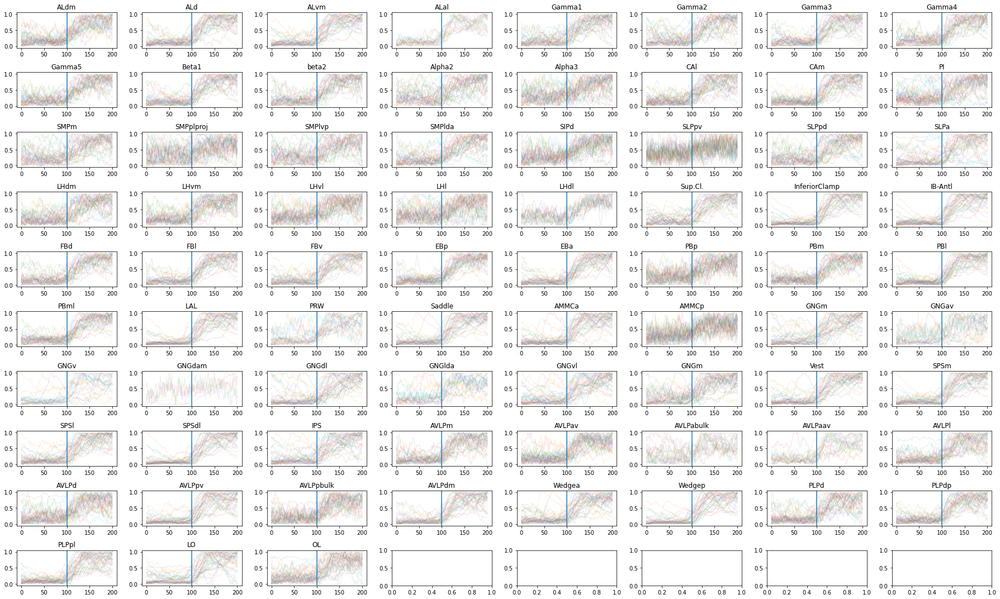

In [111]:
Corron200n=np.zeros((GoodICFiles.shape[0],75,201))
Corron200Trialn=np.zeros((int(max(sum(Trials))),75,201))
FRs=np.zeros((GoodICFiles.shape[0],75))

# Plot all trials
CorrOn=np.zeros((75,201))
fig, axs = plt.subplots(10, 8,figsize=(25,15))
for j in range(75):
    for k in range((int(max(sum(Trials))))):
        C=Corron200Trials[k,j,:]
        if (np.nanmax(C)-np.nanmin(C))!=0:
            Corron200Trialn[k,j,:]=(C-np.nanmin(C))/(np.nanmax(C)-np.nanmin(C))            
            axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].plot(Corron200Trialn[k,j,:],alpha=0.1)
    axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].set_title(NameList[j]) 
    axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].axvline(x=100)

#    except:
  #       continue   
plt.tight_layout()
plt.show()

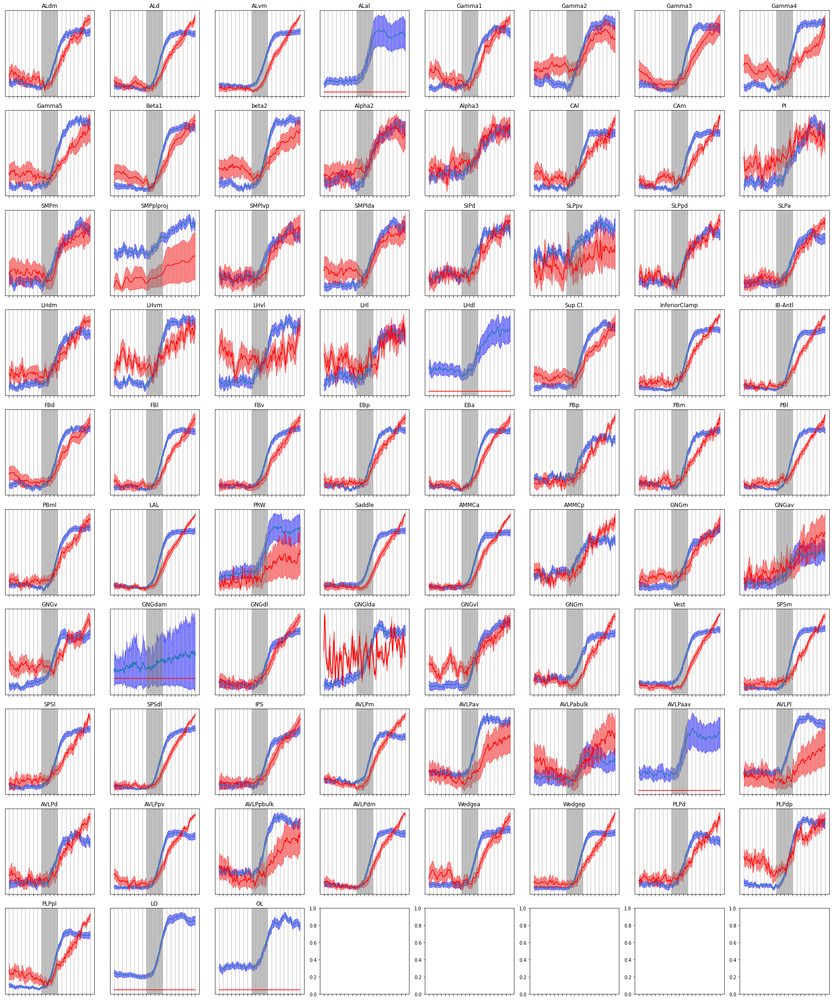

In [112]:
# Plot trial average
#CorrOn=np.zeros((75,201))
d=8
fig, axs = plt.subplots(10,d,figsize=(25,30),sharex=True)
l=0
for j in range(75):
    if sum(Trials[:,j])>4:
        err=np.nanstd(Corron200Trialn[:,j,:],axis=0)/np.sqrt(sum(Trials[:,j])-1)
        #err=np.nanstd(Corron200Trialn[:,j,:],axis=0)   
        axs[int(np.floor(l/d)),l-int(np.floor(l/d)*d)].plot(np.nanmean(Corron200Trialn[:,j,:],axis=0))
        axs[int(np.floor(l/d)),l-int(np.floor(l/d)*d)].plot(np.nanmean(Corron200TrialnForced[:,j,:],axis=0),'r')
        #axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].plot(err+np.nanmean(CompCorron200n[:,j,:],axis=0))
       # axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].plot(np.nanmean(CompCorron200n[:,j,:],axis=0)-err)
        axs[int(np.floor(l/d)),j-int(np.floor(l/d)*d)].set_title(NameList[j])     
        
        
       # axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].fill_between((np.nanmean(CompCorron200n[:,j,:],axis=0)-err), (np.nanmean(CompCorron200n[i,j,:],axis=0)+err),color='grey',alpha=0.5)  
        axs[int(np.floor(l/d)),l-int(np.floor(l/d)*d)].fill_between(range(201),np.nanmean(Corron200Trialn[:,j,:],axis=0)-err,err+np.nanmean(Corron200Trialn[:,j,:],axis=0),color='blue',
                    alpha=0.5)  
        
        
        err=np.abs(np.nanstd(Corron200TrialnForced[:,j,:],axis=0)/np.sqrt(sum(TrialsForced[:,j])-1))
        #err=np.nanstd(Corron200TrialnForced[:,j,:],axis=0)
        
        axs[int(np.floor(l/d)),l-int(np.floor(l/d)*d)].fill_between(range(201),np.nanmean(Corron200TrialnForced[:,j,:],axis=0)-err,err+np.nanmean(Corron200TrialnForced[:,j,:],axis=0),color='red',
                    alpha=0.5)          
        #axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].get_xaxis().set_visible(False)
        axs[int(np.floor(l/d)),l-int(np.floor(l/d)*d)].get_yaxis().set_visible(False)
        #axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].text(0.75, 0.05,' $n_t=$'+ str(int(sum(Trials[:,j]))), fontsize=11,fontname="Arial",horizontalalignment='center', verticalalignment='center', transform=axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].transAxes)

        axs[int(np.floor(l/d)),l-int(np.floor(l/d)*d)].axvspan(100-20, 100+20, alpha=0.5, color='grey')
        axs[int(np.floor(l/d)),l-int(np.floor(l/d)*d)].set_xticks([0,10,20,30,40,50,60,70,80,90,100,110,120,130,140,150,160,170,180,190,200])
        axs[int(np.floor(l/d)),l-int(np.floor(l/d)*d)].set_xticklabels([])
        axs[int(np.floor(l/d)),l-int(np.floor(l/d)*d)].xaxis.grid()
        #axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].set_xlim(50,151)
        for tic in axs[int(np.floor(l/d)),l-int(np.floor(l/d)*d)].xaxis.get_major_ticks():
            tic.tick1On = tic.tick2On = False

    l=l+1

    #print(np.nanmax(CompCorrOnOff[j,:]))
plt.tight_layout()    
plt.savefig('WalkFuncRegions'+line+'CorrononentsTrialsMean.svg')
plt.savefig('WalkFuncRegions'+line+'CorrononentsTrialsMean.png')
plt.show() 


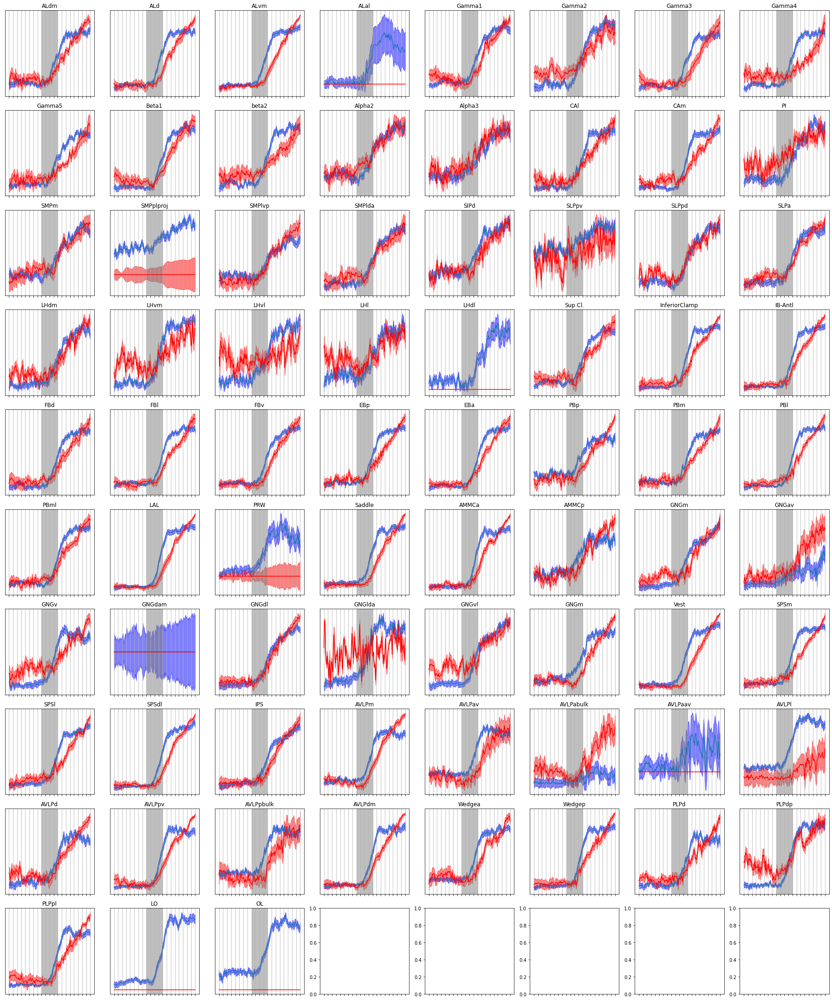

In [113]:
# Plot trial average
#CorrOn=np.zeros((75,201))
d=8
fig, axs = plt.subplots(10,d,figsize=(25,30),sharex=True)
l=0
for j in range(75):
    if sum(Trials[:,j])>4:
        err=np.nanstd(Corron200Trialn[:,j,:],axis=0)/np.sqrt(sum(Trials[:,j])-1)
        #err=np.nanstd(Corron200Trialn[:,j,:],axis=0)   
        axs[int(np.floor(l/d)),l-int(np.floor(l/d)*d)].plot(np.nanmedian(Corron200Trialn[:,j,:],axis=0))
        axs[int(np.floor(l/d)),l-int(np.floor(l/d)*d)].plot(np.nanmedian(Corron200TrialnForced[:,j,:],axis=0),'r')
        #axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].plot(err+np.nanmean(CompCorron200n[:,j,:],axis=0))
       # axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].plot(np.nanmean(CompCorron200n[:,j,:],axis=0)-err)
        axs[int(np.floor(l/d)),j-int(np.floor(l/d)*d)].set_title(NameList[j])     
        
        
       # axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].fill_between((np.nanmean(CompCorron200n[:,j,:],axis=0)-err), (np.nanmean(CompCorron200n[i,j,:],axis=0)+err),color='grey',alpha=0.5)  
        axs[int(np.floor(l/d)),l-int(np.floor(l/d)*d)].fill_between(range(201),np.nanmedian(Corron200Trialn[:,j,:],axis=0)-err,err+np.nanmedian(Corron200Trialn[:,j,:],axis=0),color='blue',
                    alpha=0.5)  
        
        
        err=np.abs(np.nanstd(Corron200TrialnForced[:,j,:],axis=0)/np.sqrt(sum(TrialsForced[:,j])-1))
        #err=np.nanstd(Corron200TrialnForced[:,j,:],axis=0)
        
        axs[int(np.floor(l/d)),l-int(np.floor(l/d)*d)].fill_between(range(201),np.nanmedian(Corron200TrialnForced[:,j,:],axis=0)-err,err+np.nanmedian(Corron200TrialnForced[:,j,:],axis=0),color='red',
                    alpha=0.5)          
        #axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].get_xaxis().set_visible(False)
        axs[int(np.floor(l/d)),l-int(np.floor(l/d)*d)].get_yaxis().set_visible(False)
        #axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].text(0.75, 0.05,' $n_t=$'+ str(int(sum(Trials[:,j]))), fontsize=11,fontname="Arial",horizontalalignment='center', verticalalignment='center', transform=axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].transAxes)

        axs[int(np.floor(l/d)),l-int(np.floor(l/d)*d)].axvspan(100-20, 100+20, alpha=0.5, color='grey')
        axs[int(np.floor(l/d)),l-int(np.floor(l/d)*d)].set_xticks([0,10,20,30,40,50,60,70,80,90,100,110,120,130,140,150,160,170,180,190,200])
        axs[int(np.floor(l/d)),l-int(np.floor(l/d)*d)].set_xticklabels([])
        axs[int(np.floor(l/d)),l-int(np.floor(l/d)*d)].xaxis.grid()
        #axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].set_xlim(50,151)
        for tic in axs[int(np.floor(l/d)),l-int(np.floor(l/d)*d)].xaxis.get_major_ticks():
            tic.tick1On = tic.tick2On = False

    l=l+1

    #print(np.nanmax(CompCorrOnOff[j,:]))
plt.tight_layout()    
plt.savefig('WalkFuncRegions'+line+'CorrononentsTrialsMedian.svg')
plt.savefig('WalkFuncRegions'+line+'CorrononentsTrialsMedian.png')
plt.show() 


107
100142
100145
100405
100411
100455
100597
100621
B369
B370
B371
B372
B373
B374
B375
B376
B377
Z:\GrunwaldKadow_group\Sophie\WalkProject\TH\B369-B380\Fly2\B377Forcedbinkd.mat
C:\Users\Soso\Desktop\FuncRegionTS\B377_150FuncRegionsTS.mat
(1692, 1)
(150, 1692)


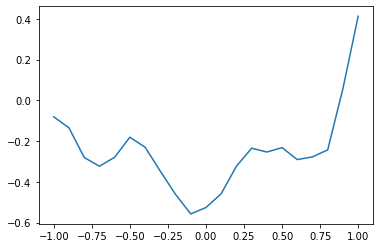

B377
B378
Z:\GrunwaldKadow_group\Sophie\WalkProject\TH\B369-B380\Fly1\B378_1_1700Forcedkd.mat
C:\Users\Soso\Desktop\FuncRegionTS\B378_150FuncRegionsTS.mat
(1700, 1)
(150, 1700)


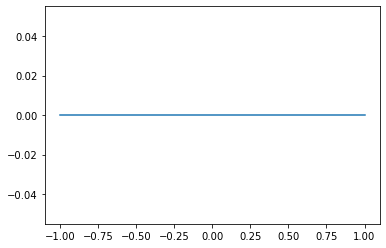

B378
46
47
TUM42
TUM43
TUM45
B765
Z:\GrunwaldKadow_group\Sophie\WalkProject\TH\B764-b768-forced\B765Forcedbinkd.mat
C:\Users\Soso\Desktop\FuncRegionTS\B765_150FuncRegionsTS.mat
(5997, 1)
(150, 5998)


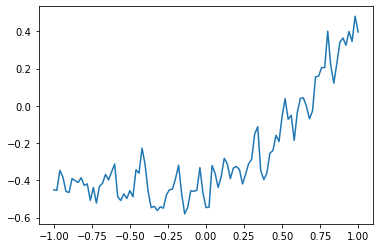

B765
B766
Z:\GrunwaldKadow_group\Sophie\WalkProject\TH\B764-b768-forced\B766Forcedbinkd.mat
C:\Users\Soso\Desktop\FuncRegionTS\B766_150FuncRegionsTS.mat
(5997, 1)
(150, 5998)


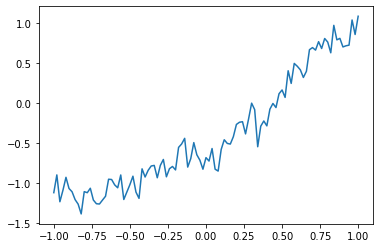

B766
B767
Z:\GrunwaldKadow_group\Sophie\WalkProject\TH\B764-b768-forced\B767Forcedbinkd.mat
C:\Users\Soso\Desktop\FuncRegionTS\B767_150FuncRegionsTS.mat
(5997, 1)
(150, 5998)


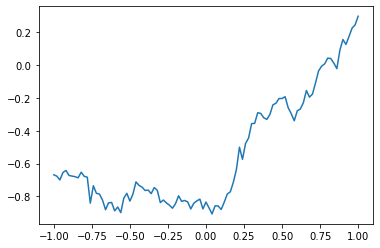

B767
B768
Z:\GrunwaldKadow_group\Sophie\WalkProject\TH\B764-b768-forced\B768Forcedbinkd.mat
C:\Users\Soso\Desktop\FuncRegionTS\B768_150FuncRegionsTS.mat
(5997, 1)
(150, 5998)


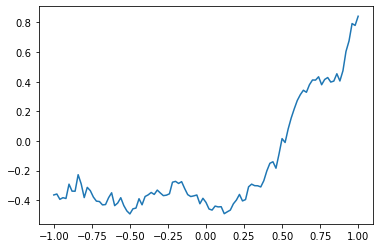

B768
B1054
B1055
28
29
158
167
B365
B361
B362


In [93]:
#GoodICFiles=GoodICFiles.query('GAL4 == "Nsyb" or GAL4 == "GMR57C10"')
line='TH'
GoodICFiles=GoodICFiles.query('GAL4 == "TH"')
Corronoff200=np.zeros((GoodICFiles.shape[0],75,201))
Corroff200=np.zeros((GoodICFiles.shape[0],75,201))
Corron200=np.zeros((GoodICFiles.shape[0],75,201))
Corron200Time=np.zeros((GoodICFiles.shape[0],75))
Corron200Trials=np.zeros((10000,75,201))
TrialsForced=np.zeros((GoodICFiles.shape[0],75))

xnew = np.linspace(-1, 1, num=201, endpoint=True)
k=np.zeros(75)

#for i in chain(range(134), range(135, 244), range(245, GoodICFiles.shape[0])):
for i in range(GoodICFiles.shape[0]):
    #try:
        print(GoodICFiles.iloc[i]['expID'])
        FR=GoodICFiles.iloc[i]['FR']
        if GoodICFiles.iloc[i]['ForcedWalkRegressor'] != '' and FR>=5:
            print(GoodICFiles.iloc[i]['ForcedWalkRegressor'])
            print("C:\\Users\\Soso\\Desktop\\FuncRegionTS\\"+GoodICFiles.iloc[i]['expID']+"_150FuncRegionsTS.mat")
            TS=loadmat("C:\\Users\\Soso\\Desktop\\FuncRegionTS\\"+GoodICFiles.iloc[i]['expID']+"_150FuncRegionsTS.mat")['TS']
            
            try:
                Regressor =loadmat(GoodICFiles.iloc[i]['ForcedWalkRegressor'].replace('kd',''))['R']
            except:
                try:
                    Regressor =loadmat(GoodICFiles.iloc[i]['ForcedWalkRegressor'].replace('kd',''))['Rwalk']
                except:
                    try:
                        Regressor =loadmat(GoodICFiles.iloc[i]['ForcedWalkRegressor'].replace('WalkRbinkd','Rbin'))['R']
                    except:
                        try:
                            Regressor =loadmat(GoodICFiles.iloc[i]['ForcedWalkRegressor'].replace('Rbinkd','Rbin'))['Rbin']
                        except:
                            Regressor =loadmat(GoodICFiles.iloc[i]['ForcedWalkRegressor'].replace('kd',''))['Rbin']
            print(Regressor.shape)
            if Regressor.shape[0]<Regressor.shape[1]:
                Regressor=Regressor.T
            if TS.shape[0]>TS.shape[1]:
                TS=TS.T            
            print(TS.shape)
            # processed time series have 2 less time points from kalman filter processing, and sometimes one time point difference from triggering imprecisions.
            
            if TS.shape[1]==(Regressor.shape[0]-2):
                Regressor=Regressor[1:Regressor.shape[0]-1]   
            if TS.shape[1]==(Regressor.shape[0]-3):
                Regressor=Regressor[2:Regressor.shape[0]-1]                
            if TS.shape[1]==(Regressor.shape[0]-1):
                Regressor=Regressor[1:Regressor.shape[0]]               
            if TS.shape[1]==(Regressor.shape[0]+1):
                TS=TS[:,0:Regressor.shape[0]] 


            TS=TS[range(75),:]+TS[range(75,150),:]
            #if len(TS)!=1 and pd.isnull(FR)==False:
            if len(TS)!=1:
                
                
                           
                Ron=np.zeros(len(Regressor))
                Roff=np.zeros(len(Regressor))
                for m in range(int(3*FR),int(len(Regressor)-int(3*FR))):
                    if Regressor[m]==1 and all(Regressor[int(m-3*FR):int(m)]==0) and (np.mean(Regressor[int(m+1):int(m+0.5*FR)])>0.5):
                        Ron[m]=1                        
                    if Regressor[m]==1 and all(Regressor[int(m+1):int(m+1*FR)]==0) and (np.mean(Regressor[int(m-1*FR):int(m-1)])>0.5):
                        Roff[m+1]=1                    
                

                for j in range(75):    

                    if np.isnan(np.mean(TS[j,:]))==False:
                        TS[j,:]=TS[j,:]/np.nanmax(TS[j,:])
                        Ton=[p for p in range(len(np.squeeze(Ron.T))) if Ron[p]==1]
                        
                        ## full correlation
                        Corr=np.correlate(TS[j,:],np.squeeze(Regressor.T), 'full')
                        Corrloc=Corr[int((len(Corr)-1)/2-FR):int((len(Corr)-1)/2+FR)+1]
                        x = np.linspace(-1, 1, num=len(Corrloc), endpoint=True)
                        Corrlocint=scipy.interpolate.interp1d(x,Corrloc, kind='cubic')                        
                        Corronoff200[i,j,:]=Corronoff200[i,j,:]+Corrlocint(xnew)

                        ## onset correlation
                        Corr=np.correlate(TS[j,:],np.squeeze(Ron.T), 'full')
                        #lags = scipy.signal.correlation_lags(len(TS[j,:])/FR)
                        Corrloc=Corr[int((len(Corr)-1)/2-FR):int((len(Corr)-1)/2+FR)+1]
                        Corrloc50=Corr[int(((len(Corr)-1)/2)-FR):int(((len(Corr)-1)/2)+0.5*FR)+1]
                        x = np.linspace(-1, 1, num=len(Corrloc), endpoint=True)
                        x50 = np.linspace(-1, 0.5, num=len(Corrloc50), endpoint=True)
                        Corrlocint=scipy.interpolate.interp1d(x,Corrloc, kind='cubic')
                        
                        Corron200[i,j,:]=Corron200[i,j,:]+Corrlocint(xnew)
                        
                        if j==7:
                            plt.plot(x,Corrloc)                            
                        ## get peri-onset time series per trial
                        for l in range(int(sum(Ron))):
                            Tloc=TS[j,int(Ton[l]-FR):int(Ton[l]+FR+1)]
                            #x = np.linspace(-1, 1, num=len(Tloc), endpoint=True)
                            Tlocint=scipy.interpolate.interp1d(x,Tloc, kind='cubic')
                            Corron200Trials[int(k[j]+l),j,:]=Tlocint(xnew)

                        plt.show()   
                        k[j]=k[j]+sum(Ron)
                        TrialsForced[i,j]=sum(Ron) 
                        del Corrlocint, Corrloc, Corr
                        
                        Corr=np.correlate(TS[j,:],np.squeeze(Roff.T), 'full')
                        Corrloc=Corr[int((len(Corr)-1)/2-FR):int((len(Corr)-1)/2+FR)+1]
                        x = np.linspace(-1, 1, num=len(Corrloc), endpoint=True)
                        Corrlocint=scipy.interpolate.interp1d(x,Corrloc, kind='cubic')
                        Corroff200[i,j,:]=Corroff200[i,j,:]+Corrlocint(xnew)
                        
                del TS
                print(GoodICFiles.iloc[i]['expID'])
   # except:
       #  continue   


#Corron200Time[i,NameList.index(RegName)]=Corron200Time[i,NameList.index(RegName)]/(k[NameList.index(RegName)]+1)

#np.save('PANFuncRegionsCorron200Time_allfreq.npy',Corron200Time)
#np.save('PANFunRegionsCorron200_sllfreq.npy',Corron200)

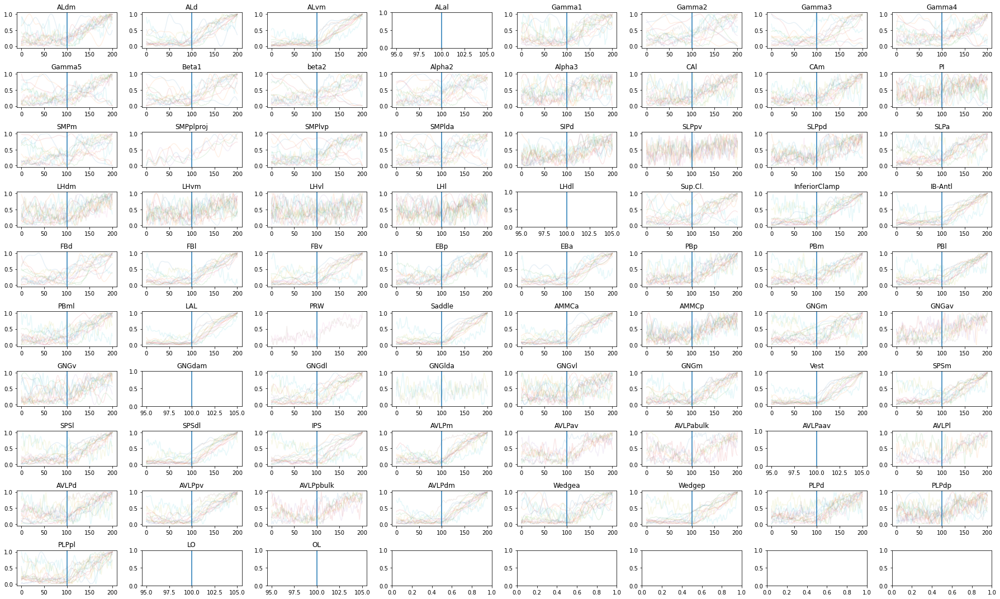

In [80]:
Corron200n=np.zeros((GoodICFiles.shape[0],75,201))
Corron200TrialnForced=np.zeros((int(max(sum(Trials))),75,201))
FRs=np.zeros((GoodICFiles.shape[0],75))

# Plot all trials
CorrOn=np.zeros((75,201))
fig, axs = plt.subplots(10, 8,figsize=(25,15))
for j in range(75):
    for k in range((int(max(sum(Trials))))):
        C=Corron200Trials[k,j,:]
        if (np.nanmax(C)-np.nanmin(C))!=0:
            Corron200TrialnForced[k,j,:]=(C-np.nanmin(C))/(np.nanmax(C)-np.nanmin(C))            
            axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].plot(Corron200TrialnForced[k,j,:],alpha=0.1)
    axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].set_title(NameList[j]) 
    axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].axvline(x=100)

#    except:
  #       continue   
plt.tight_layout()
plt.show()

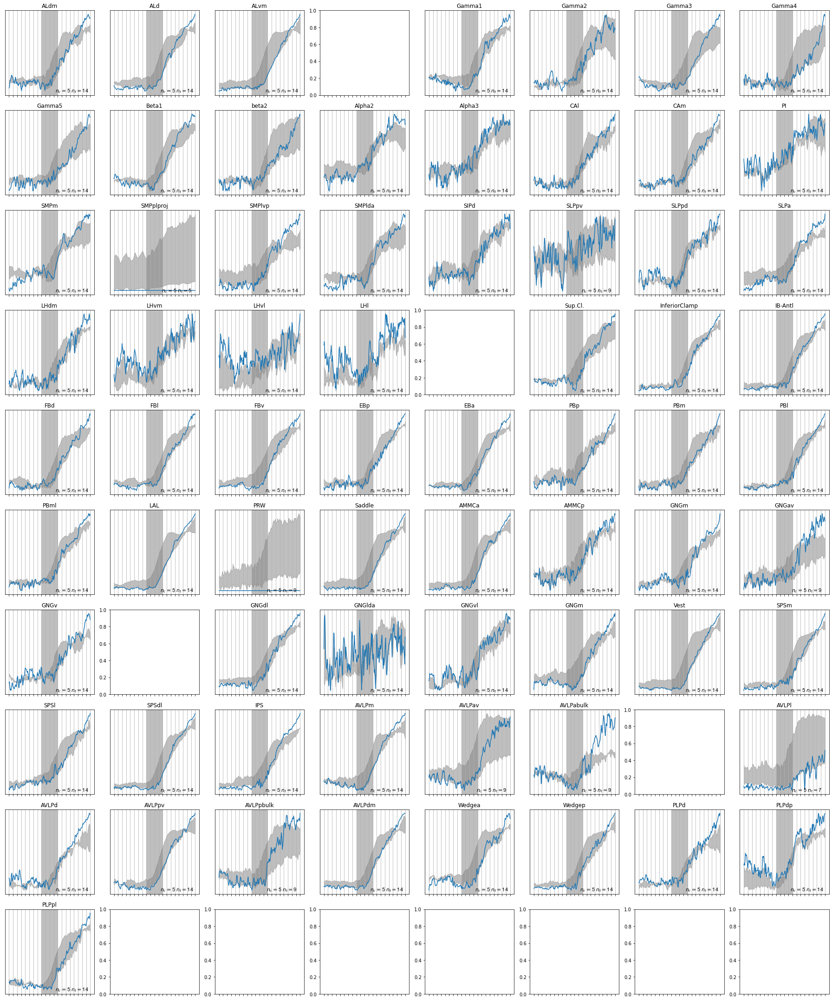

In [83]:
# Plot trial average
#CorrOn=np.zeros((75,201))
d=8
fig, axs = plt.subplots(10,d,figsize=(25,30),sharex=True)
l=0
for j in range(75):
    if sum(Trials[:,j])>4:
        err=np.nanstd(Corron200TrialnForced[:,j,:],axis=0)/np.sqrt(sum(Trials[:,j])-1)
        axs[int(np.floor(l/d)),l-int(np.floor(l/d)*d)].plot(np.nanmedian(Corron200TrialnForced[:,j,:],axis=0))
        #axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].plot(err+np.nanmean(CompCorron200n[:,j,:],axis=0))
       # axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].plot(np.nanmean(CompCorron200n[:,j,:],axis=0)-err)
        axs[int(np.floor(l/d)),j-int(np.floor(l/d)*d)].set_title(NameList[j])     
       # axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].fill_between((np.nanmean(CompCorron200n[:,j,:],axis=0)-err), (np.nanmean(CompCorron200n[i,j,:],axis=0)+err),color='grey',alpha=0.5)  
        axs[int(np.floor(l/d)),l-int(np.floor(l/d)*d)].fill_between(range(201),np.nanmean(Corron200TrialnForced[:,j,:],axis=0)-err,err+np.nanmean(Corron200Trialn[:,j,:],axis=0),color='grey',
                     alpha=0.5)  
        #axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].get_xaxis().set_visible(False)
        axs[int(np.floor(l/d)),l-int(np.floor(l/d)*d)].get_yaxis().set_visible(False)
        axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].text(0.75, 0.05, '$n_c=$'+str(int(5))+' $n_t=$'+ str(int(sum(Trials[:,j]))), fontsize=11,fontname="Arial",horizontalalignment='center', verticalalignment='center', transform=axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].transAxes)

        axs[int(np.floor(l/d)),l-int(np.floor(l/d)*d)].axvspan(100-20, 100+20, alpha=0.5, color='grey')
        axs[int(np.floor(l/d)),l-int(np.floor(l/d)*d)].set_xticks([0,10,20,30,40,50,60,70,80,90,100,110,120,130,140,150,160,170,180,190,200])
        axs[int(np.floor(l/d)),l-int(np.floor(l/d)*d)].set_xticklabels([])
        axs[int(np.floor(l/d)),l-int(np.floor(l/d)*d)].xaxis.grid()
        #axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].set_xlim(50,151)
        for tic in axs[int(np.floor(l/d)),l-int(np.floor(l/d)*d)].xaxis.get_major_ticks():
            tic.tick1On = tic.tick2On = False

    l=l+1

    #print(np.nanmax(CompCorrOnOff[j,:]))
plt.tight_layout()    
plt.savefig('ForcedWalkFuncRegions'+line+'CorrononentsTrialsAv.svg')
plt.savefig('ForcedWalkFuncRegions'+line+'CorrononentsTrialsAv.png')
plt.show() 


In [61]:
np.save('FuncR'+line+'Corron.npy',Corron200)
np.save('FuncR'+line+'Corroff.npy',Corroff200)
np.save('FuncR'+line+'Corronoff.npy',Corronoff200)
np.save('FuncR'+line+'Ks.npy',k)
np.save('FuncR'+line+'Trials.npy',Trials)
np.save('FuncR'+line+'CorronTrials.npy',Corron200Trials)

NameError: name 'Corroff200Trials' is not defined

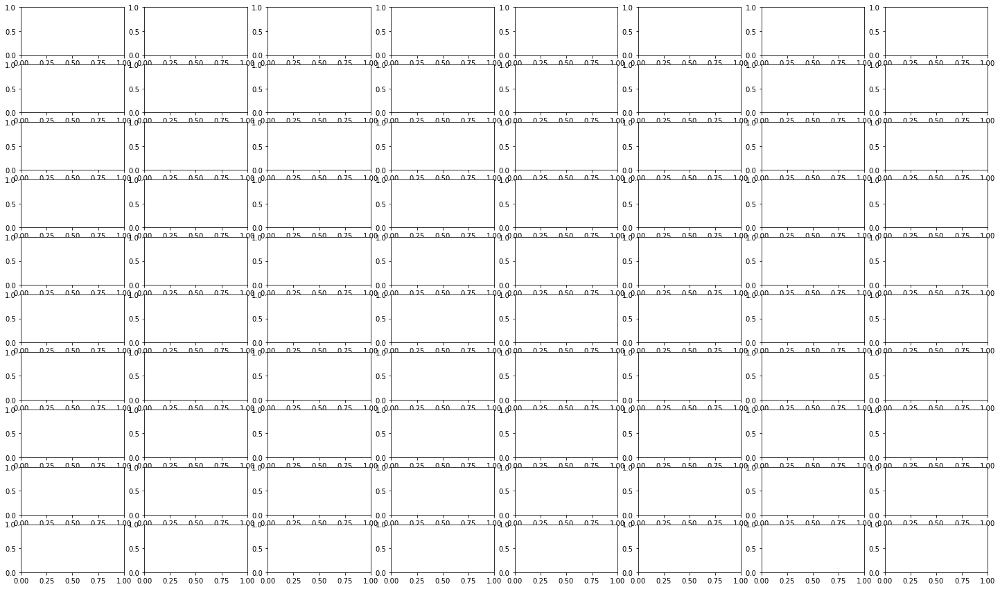

In [66]:
Corroff200n=np.zeros((GoodICFiles.shape[0],75,201))
Corroff200Trialn=np.zeros((int(max(sum(Trials))),75,201))
FRs=np.zeros((GoodICFiles.shape[0],75))

# Plot all trials
CorrOff=np.zeros((75,201))
fig, axs = plt.subplots(10, 8,figsize=(25,15))
for j in range(75):
    for k in range((int(max(sum(Trials))))):
        C=Corroff200Trials[k,j,:]
        if (np.nanmax(C)-np.nanmin(C))!=0:
            Corroff200Trialn[k,j,:]=(C-np.nanmin(C))/(np.nanmax(C)-np.nanmin(C))            
            axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].plot(Corroff200Trialn[k,j,:],alpha=0.1)
    axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].set_title(NameList[j]) 
    axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].axvline(x=100)

#    except:
  #       continue   
plt.tight_layout()
plt.show()

In [ ]:
# Plot trial average
CorrOff=np.zeros((75,201))
d=8
fig, axs = plt.subplots(10,d,figsize=(25,30),sharex=True)
l=0
for j in range(75):
    if sum(Trials[:,j])>5:
        err=np.nanstd(Corroff200Trialn[:,j,:],axis=0)/np.sqrt(sum(Trials[:,j])-1)
        axs[int(np.floor(l/d)),l-int(np.floor(l/d)*d)].plot(np.nanmean(Corroff200Trialn[:,j,:],axis=0))
        #axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].plot(err+np.nanmean(CompCorron200n[:,j,:],axis=0))
       # axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].plot(np.nanmean(CompCorron200n[:,j,:],axis=0)-err)
        axs[int(np.floor(l/d)),j-int(np.floor(l/d)*d)].set_title(NameList[j])     
       # axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].fill_between((np.nanmean(CompCorron200n[:,j,:],axis=0)-err), (np.nanmean(CompCorron200n[i,j,:],axis=0)+err),color='grey',alpha=0.5)  
        axs[int(np.floor(l/d)),l-int(np.floor(l/d)*d)].fill_between(range(201),np.nanmean(Corron200Trialn[:,j,:],axis=0)-err,err+np.nanmean(Corron200Trialn[:,j,:],axis=0),color='grey',
                     alpha=0.5)  
        #axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].get_xaxis().set_visible(False)
        axs[int(np.floor(l/d)),l-int(np.floor(l/d)*d)].get_yaxis().set_visible(False)
        axs[int(np.floor(l/d)),l-int(np.floor(l/d)*d)].axvspan(100-5, 100+5, alpha=0.5, color='red')
        axs[int(np.floor(l/d)),l-int(np.floor(l/d)*d)].set_xticks([0,10,20,30,40,50,60,70,80,90,100,110,120,130,140,150,160,170,180,190,200])
        axs[int(np.floor(l/d)),l-int(np.floor(l/d)*d)].set_xticklabels([])
        axs[int(np.floor(l/d)),l-int(np.floor(l/d)*d)].xaxis.grid()
        #axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].set_xlim(50,151)
        for tic in axs[int(np.floor(l/d)),l-int(np.floor(l/d)*d)].xaxis.get_major_ticks():
            tic.tick1On = tic.tick2On = False

        l=l+1

    #print(np.nanmax(CompCorrOnOff[j,:]))
plt.tight_layout()    
plt.savefig('Z:\GrunwaldKadow_group\Sophie\WalkProject\Figures\Figure7\ForcedFuncRegionsTHCorroffonentsTrialsAv.svg')
plt.savefig('Z:\GrunwaldKadow_group\Sophie\WalkProject\Figures\Figure7\ForcedFuncRegionsTHCorroffonentsTrialsAv.png')
plt.show() 


In [43]:
Compdf=pd.read_pickle("Z:\GrunwaldKadow_group\Sophie\WalkProject\Compdf.pkl")
GoodICFiles=pd.read_pickle("Z:\GrunwaldKadow_group\Sophie\WalkProject\GoodICsdf.pkl")
Regionsdf=pd.read_pickle("Z:\GrunwaldKadow_group\Sophie\WalkProject\Regionsdf.pkl")
GoodICFiles=GoodICFiles.query('GAL4 == "TH"')
Regionsdf=Regionsdf.query('GAL4 == "TH"')

Corronoff200=np.zeros((GoodICFiles.shape[0],75,201))
Corroff200=np.zeros((GoodICFiles.shape[0],75,201))
Corron200=np.zeros((GoodICFiles.shape[0],75,201))
Corron200Time=np.zeros((GoodICFiles.shape[0],75))
Regionsdf['OnTime']=np.nan
Corron200Trials=np.zeros((10000,75,201))
Trials=np.zeros((GoodICFiles.shape[0],75))

xnew = np.linspace(-1, 1, num=201, endpoint=True)
k=np.zeros(75)

#for i in chain(range(134), range(135, 244), range(245, GoodICFiles.shape[0])):
for i in range(GoodICFiles.shape[0]):
   # try:
        if GoodICFiles.iloc[i]['WalkRegressor'] != '':
            TS=loadmat("C:\\Users\\Soso\\Desktop\\FuncRegionTS\\"+list(GoodICFiles.loc[GoodICFiles.index == i]['expID'])[0]+"_150FuncRegionsTS.mat")['TS']

            try:
                Regressor =loadmat(GoodICFiles.iloc[i]['ForcedWalkRegressor'].replace('kd',''))['R']
            except:
                try:
                    Regressor =loadmat(GoodICFiles.iloc[i]['ForcedWalkRegressor'].replace('kd',''))['Rwalk']
                except:
                    try:
                        Regressor =loadmat(GoodICFiles.iloc[i]['ForcedWalkRegressor'].replace('WalkRbinkd','Rbin'))['R']
                    except:
                        try:
                            Regressor =loadmat(GoodICFiles.iloc[i]['ForcedWalkRegressor'].replace('Rbinkd','Rbin'))['Rbin']
                        except:
                            Regressor =loadmat(GoodICFiles.iloc[i]['ForcedWalkRegressor'].replace('kd',''))['Rbin']
            print(Regressor.shape)
            if Regressor.shape[0]<Regressor.shape[1]:
                Regressor=Regressor.T
            if TS.shape[0]>TS.shape[1]:
                TS=TS.T            
   
            # processed time series have 2 less time points from kalman filter processing, and sometimes one time point difference from triggering imprecisions.

            if TS.shape[1]==(Regressor.shape[0]-2):
                Regressor=Regressor[1:Regressor.shape[0]-1]   
            if TS.shape[1]==(Regressor.shape[0]-3):
                Regressor=Regressor[2:Regressor.shape[0]-1]                
            if TS.shape[1]==(Regressor.shape[0]-1):
                Regressor=Regressor[1:Regressor.shape[0]]               
            if TS.shape[1]==(Regressor.shape[0]+1):
                TS=TS[:,0:Regressor.shape[0]] 


            TS=TS[range(75),:]+TS[range(75,150),:]
            #if len(TS)!=1 and pd.isnull(FR)==False:
            if len(TS)!=1:
                FR=GoodICFiles.iloc[i]['FR']
                print(GoodICFiles.iloc[i]['expID'])
                           
                Ron=np.zeros(len(Regressor))
                Roff=np.zeros(len(Regressor))
                for m in range(int(2*FR),int(len(Regressor)-2*FR)):
                    if Regressor[m]==1 and all(Regressor[int(m-2*FR):int(m)]==0) and (np.mean(Regressor[int(m+1):int(m+0.5*FR)])>0.5):
                        Ron[m]=1                        
                    if Regressor[m]==1 and all(Regressor[int(m+1):int(m+1*FR)]==0) and (np.mean(Regressor[int(m-1*FR):int(m-1)])>0.5):
                        Roff[m+1]=1                    
                

                for j in range(75):    

                    if np.isnan(np.mean(TS[j,:]))==False:
                        TS[j,:]=TS[j,:]/np.nanmax(TS[j,:])
                        Ton=[p for p in range(len(np.squeeze(Ron.T))) if Ron[p]==1]
                        
                        ## full correlation
                        Corr=np.correlate(TS[j,:],np.squeeze(Regressor.T), 'full')
                        Corrloc=Corr[int((len(Corr)-1)/2-FR):int((len(Corr)-1)/2+FR)+1]
                        x = np.linspace(-1, 1, num=len(Corrloc), endpoint=True)
                        Corrlocint=scipy.interpolate.interp1d(x,Corrloc, kind='cubic')                        
                        Corronoff200[i,j,:]=Corronoff200[i,j,:]+Corrlocint(xnew)

                        ## onset correlation
                        Corr=np.correlate(TS[j,:],np.squeeze(Ron.T), 'full')
                        #lags = scipy.signal.correlation_lags(len(TS[j,:])/FR)
                        Corrloc=Corr[int((len(Corr)-1)/2-FR):int((len(Corr)-1)/2+FR)+1]
                        Corrloc50=Corr[int(((len(Corr)-1)/2)-FR):int(((len(Corr)-1)/2)+0.5*FR)+1]
                        x = np.linspace(-1, 1, num=len(Corrloc), endpoint=True)
                        x50 = np.linspace(-1, 0.5, num=len(Corrloc50), endpoint=True)
                        Corrlocint=scipy.interpolate.interp1d(x,Corrloc, kind='cubic')
                        
                        Corron200[i,j,:]=Corron200[i,j,:]+Corrlocint(xnew)
                        
                        if j==32:
                            plt.plot(x,Corrloc)                            
                        ## get peri-onset time series per trial
                        for l in range(int(sum(Ron))):
                            Tloc=TS[j,int(Ton[l]-FR):int(Ton[l]+FR+1)]
                            #x = np.linspace(-1, 1, num=len(Tloc), endpoint=True)
                            Tlocint=scipy.interpolate.interp1d(x,Tloc, kind='cubic')
                            Corron200Trials[int(k[j]+l),j,:]=Tlocint(xnew)

                        plt.show()   
                        k[j]=k[j]+sum(Ron)
                        Trials[i,j]=sum(Ron) 
                        del Corrlocint, Corrloc, Corr
                        
                        Corr=np.correlate(TS[j,:],np.squeeze(Roff.T), 'full')
                        Corrloc=Corr[int((len(Corr)-1)/2-FR):int((len(Corr)-1)/2+FR)+1]
                        x = np.linspace(-1, 1, num=len(Corrloc), endpoint=True)
                        Corrlocint=scipy.interpolate.interp1d(x,Corrloc, kind='cubic')
                        Corroff200[i,j,:]=Corroff200[i,j,:]+Corrlocint(xnew)

                del TS
                
   # except:
       #  continue   


#Corron200Time[i,NameList.index(RegName)]=Corron200Time[i,NameList.index(RegName)]/(k[NameList.index(RegName)]+1)

np.save('THForcedFuncRegionsCorron200Time_allfreq.npy',Corron200Time)
np.save('THForcedFunRegionsCorron200_allfreq.npy',Corron200)

FileNotFoundError: [Errno 2] No such file or directory: 'Z:\\GrunwaldKadow_group\\Sophie\\WalkProject\\Compdf.pkl'

In [ ]:
int(max(sum(Trials)))

In [ ]:
Corron200n=np.zeros((GoodICFiles.shape[0],75,201))
Corron200Trialn=np.zeros((int(max(sum(Trials))),75,201))
FRs=np.zeros((GoodICFiles.shape[0],75))

# Plot all trials
CorrOn=np.zeros((75,201))
fig, axs = plt.subplots(10, 8,figsize=(25,15))
for j in range(75):
    for k in range((int(max(sum(Trials))))):
        C=Corron200Trials[k,j,:]
        if (np.nanmax(C)-np.nanmin(C))!=0:
            Corron200Trialn[k,j,:]=(C-np.nanmin(C))/(np.nanmax(C)-np.nanmin(C))            
            axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].plot(Corron200Trialn[k,j,:],alpha=0.1)
    axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].set_title(NameList[j]) 
    axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].axvline(x=100)

#    except:
  #       continue   
plt.tight_layout()
plt.show()

In [ ]:
# Plot trial average
CorrOn=np.zeros((75,201))
d=8
fig, axs = plt.subplots(10,d,figsize=(25,30),sharex=True)
l=0
for j in range(75):
    if sum(Trials[:,j])>5:
        err=np.nanstd(Corron200Trialn[:,j,:],axis=0)/np.sqrt(sum(Trials[:,j])-1)
        axs[int(np.floor(l/d)),l-int(np.floor(l/d)*d)].plot(np.nanmean(Corron200Trialn[:,j,:],axis=0))
        #axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].plot(err+np.nanmean(CompCorron200n[:,j,:],axis=0))
       # axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].plot(np.nanmean(CompCorron200n[:,j,:],axis=0)-err)
        axs[int(np.floor(l/d)),j-int(np.floor(l/d)*d)].set_title(NameList[j])     
       # axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].fill_between((np.nanmean(CompCorron200n[:,j,:],axis=0)-err), (np.nanmean(CompCorron200n[i,j,:],axis=0)+err),color='grey',alpha=0.5)  
        axs[int(np.floor(l/d)),l-int(np.floor(l/d)*d)].fill_between(range(201),np.nanmean(Corron200Trialn[:,j,:],axis=0)-err,err+np.nanmean(Corron200Trialn[:,j,:],axis=0),color='grey',
                     alpha=0.5)  
        #axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].get_xaxis().set_visible(False)
        axs[int(np.floor(l/d)),l-int(np.floor(l/d)*d)].get_yaxis().set_visible(False)
        axs[int(np.floor(l/d)),l-int(np.floor(l/d)*d)].axvspan(100-5, 100+5, alpha=0.5, color='red')
        axs[int(np.floor(l/d)),l-int(np.floor(l/d)*d)].set_xticks([0,10,20,30,40,50,60,70,80,90,100,110,120,130,140,150,160,170,180,190,200])
        axs[int(np.floor(l/d)),l-int(np.floor(l/d)*d)].set_xticklabels([])
        axs[int(np.floor(l/d)),l-int(np.floor(l/d)*d)].xaxis.grid()
        #axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].set_xlim(50,151)
        for tic in axs[int(np.floor(l/d)),l-int(np.floor(l/d)*d)].xaxis.get_major_ticks():
            tic.tick1On = tic.tick2On = False

        l=l+1

    #print(np.nanmax(CompCorrOnOff[j,:]))
plt.tight_layout()    
plt.savefig('Z:\GrunwaldKadow_group\Sophie\WalkProject\Figures\Figure6\Fig6FuncRegionsPANCorrononentsTrialsAv.svg')
plt.savefig('Z:\GrunwaldKadow_group\Sophie\WalkProject\Figures\Figure6\Fig6FuncRegionsPANCorrononentsTrialsAv.png')
plt.show() 


In [ ]:
Corroff200n=np.zeros((GoodICFiles.shape[0],75,201))
Corroff200Trialn=np.zeros((int(max(sum(Trials))),75,201))
FRs=np.zeros((GoodICFiles.shape[0],75))

# Plot all trials
CorrOff=np.zeros((75,201))
fig, axs = plt.subplots(10, 8,figsize=(25,15))
for j in range(75):
    for k in range((int(max(sum(Trials))))):
        C=Corroff200Trials[k,j,:]
        if (np.nanmax(C)-np.nanmin(C))!=0:
            Corroff200Trialn[k,j,:]=(C-np.nanmin(C))/(np.nanmax(C)-np.nanmin(C))            
            axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].plot(Corroff200Trialn[k,j,:],alpha=0.1)
    axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].set_title(NameList[j]) 
    axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].axvline(x=100)

#    except:
  #       continue   
plt.tight_layout()
plt.show()

In [ ]:
# Plot trial average
CorrOff=np.zeros((75,201))
d=8
fig, axs = plt.subplots(10,d,figsize=(25,30),sharex=True)
l=0
for j in range(75):
    if sum(Trials[:,j])>5:
        err=np.nanstd(Corroff200Trialn[:,j,:],axis=0)/np.sqrt(sum(Trials[:,j])-1)
        axs[int(np.floor(l/d)),l-int(np.floor(l/d)*d)].plot(np.nanmean(Corroff200Trialn[:,j,:],axis=0))
        #axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].plot(err+np.nanmean(CompCorron200n[:,j,:],axis=0))
       # axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].plot(np.nanmean(CompCorron200n[:,j,:],axis=0)-err)
        axs[int(np.floor(l/d)),j-int(np.floor(l/d)*d)].set_title(NameList[j])     
       # axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].fill_between((np.nanmean(CompCorron200n[:,j,:],axis=0)-err), (np.nanmean(CompCorron200n[i,j,:],axis=0)+err),color='grey',alpha=0.5)  
        axs[int(np.floor(l/d)),l-int(np.floor(l/d)*d)].fill_between(range(201),np.nanmean(Corron200Trialn[:,j,:],axis=0)-err,err+np.nanmean(Corron200Trialn[:,j,:],axis=0),color='grey',
                     alpha=0.5)  
        #axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].get_xaxis().set_visible(False)
        axs[int(np.floor(l/d)),l-int(np.floor(l/d)*d)].get_yaxis().set_visible(False)
        axs[int(np.floor(l/d)),l-int(np.floor(l/d)*d)].axvspan(100-5, 100+5, alpha=0.5, color='red')
        axs[int(np.floor(l/d)),l-int(np.floor(l/d)*d)].set_xticks([0,10,20,30,40,50,60,70,80,90,100,110,120,130,140,150,160,170,180,190,200])
        axs[int(np.floor(l/d)),l-int(np.floor(l/d)*d)].set_xticklabels([])
        axs[int(np.floor(l/d)),l-int(np.floor(l/d)*d)].xaxis.grid()
        #axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].set_xlim(50,151)
        for tic in axs[int(np.floor(l/d)),l-int(np.floor(l/d)*d)].xaxis.get_major_ticks():
            tic.tick1On = tic.tick2On = False

        l=l+1

    #print(np.nanmax(CompCorrOnOff[j,:]))
plt.tight_layout()    
plt.savefig('Z:\GrunwaldKadow_group\Sophie\WalkProject\Figures\Figure6\Fig6FuncRegionsPANCorroffonentsTrialsAv.svg')
plt.savefig('Z:\GrunwaldKadow_group\Sophie\WalkProject\Figures\Figure6\Fig6FuncRegionsPANCorroffonentsTrialsAv.png')
plt.show() 


In [ ]:
Corron200n=np.zeros((GoodICFiles.shape[0],75,201))
Corron200Trialn=np.zeros((int(max(sum(Trials))),75,201))
FRs=np.zeros((GoodICFiles.shape[0],75))

# Plot all trials
CorrOn=np.zeros((75,201))
fig, axs = plt.subplots(10, 8,figsize=(25,15))
for j in range(75):
    for k in range((int(max(sum(Trials))))):
        C=Corron200Trials[k,j,:]
        if (np.nanmax(C)-np.nanmin(C))!=0:
            Corron200Trialn[k,j,:]=(C-np.nanmin(C))/(np.nanmax(C)-np.nanmin(C))            
            axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].plot(Corron200Trialn[k,j,:],alpha=0.1)
    axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].set_title(NameList[j]) 
    axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].axvline(x=100)

#    except:
  #       continue   
plt.tight_layout()
plt.show()